<div style="background-image: url('https://cdn.pixabay.com/photo/2014/10/23/10/10/dollars-499481_1280.jpg'); background-size: cover; background-color: #FFD700 ;text-align: center; padding: 20px; border-radius: 10px; font-family: 'Arial', sans-serif; font-size: 36px; font-weight: bold; color: #8B4513;"></div>

<h1 style="color: #8B4513; text-align: center;">Insurance Claim Fraud Detection</h1>

<div style="background-image: url('https://cdn.pixabay.com/photo/2014/10/23/10/10/dollars-499481_1280.jpg'); background-size: cover; background-color: #FFD700 ;text-align: center; padding: 20px; border-radius: 10px; font-family: 'Arial', sans-serif; font-size: 36px; font-weight: bold; color: #8B4513;"></div>

# <span style="color:red;">Project Description</span>

Insurance fraud poses a significant challenge in the industry, making the identification of fraudulent claims a complex task. Leveraging Machine Learning provides a unique opportunity for the Auto Insurance sector to address this issue effectively.

## Project Overview

In this project, a dataset is provided containing details of insurance policies, customer information, and accident-related data. The objective is to create a predictive model that can determine whether an insurance claim is fraudulent or not.

## Independent Variables

1. **months_as_customer**: Number of months of patronage
2. **age**: The length of time a customer has lived or a thing has existed
3. **policy_number**: Unique ID to track customer subscription status and other details
4. **policy_bind_date**: Document date given to the customer upon insurance proposal acceptance
5. **policy_state**: Identifies the insured, covered risks, policy limits, and period
6. **policy_csl**: Combined Single Limit
7. **policy_deductible**: Amount customer is responsible for paying towards an insured loss
8. **policy_annual_premium**: Regular premium payable by the policyholder in a policy year
9. **umbrella_limit**: Extra insurance providing protection beyond existing limits
10. **insured_zip**: Zip code where the insurance was made
11. **insured_sex**: Customer's gender (male/female)
12. **insured_education_level**: Level of education of the customer
13. **insured_occupation**: Occupation of the customer
14. **insured_hobbies**: Customer's leisure activities
15. **insured_relationship**: Customer's relationship status (single, married, etc.)
16. **capital-gains**: Profit accrued due to insurance premium
17. **capital-loss**: Losses incurred due to insurance claims
18. **incident_date**: Date when claims were made by customers
19. **incident_type**: Type of claim/vehicle damage made by the customer
20. **collision_type**: Area of damage on the vehicle
21. **incident_severity**: Extent/level of damage
22. **authorities_contacted**: Government agencies contacted after damage
23. **incident_state**: State where the accident happened
24. **incident_city**: City where the accident happened
25. **incident_location**: Location where the accident happened
26. **incident_hour_of_the_day**: Period of the day when the accident took place
27. **number_of_vehicles_involved**: Number of vehicles involved in the accident
28. **property_damage**: Whether property was damaged or not
29. **bodily_injuries**: Injuries sustained
30. **witnesses**: Number of witnesses involved
31. **police_report_available**: Whether the report on damage was documented
32. **total_claim_amount**: Financial implications involved in claims
33. **injury_claim**: Physical injuries sustained
34. **property_claim**: Property damages during the incident
35. **vehicle_claim**: Vehicle damages during the incident
36. **auto_make**: Make of the vehicle
37. **auto_model**: Model of the vehicle
38. **auto_year**: Year in which the vehicle was manufactured
39. **_c39**
40. **fraud_reported**

## Dataset Link
- [Insurance Fraud Dataset](https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv)


# <span style="color:red;">Importing libraries and data collection</span>

In [48]:
import pandas as pd
import numpy as np
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder, StandardScaler,  PowerTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pickle

In [3]:
df=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


# <span style="color:red;">Data Analysis</span>

In [5]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [6]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

# Dataset Overview

Our dataset consists of 1000 rows and 40 columns, featuring a combination of numerical and categorical data. The distribution of data types is as follows:

- **float64:** 2 columns
- **int64:** 17 columns
- **object:** 21 columns

## Missing Values

Upon initial inspection, it's identified that there are missing values in the column `_c39`. However, further investigation is required to comprehensively assess the extent and nature of these missing values.

In [8]:
df.duplicated().sum()

0

In [9]:
# Checking for Missing values
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

                             Missing Values  % Missing data
_c39                                   1000           100.0
age                                       0             0.0
incident_state                            0             0.0
incident_city                             0             0.0
incident_location                         0             0.0
incident_hour_of_the_day                  0             0.0
number_of_vehicles_involved               0             0.0
property_damage                           0             0.0
bodily_injuries                           0             0.0
witnesses                                 0             0.0
police_report_available                   0             0.0
total_claim_amount                        0             0.0
injury_claim                              0             0.0
property_claim                            0             0.0
vehicle_claim                             0             0.0
auto_make                               

In [10]:
# Dropping Missing values column
df.drop('_c39',axis=1,inplace=True)

In [13]:
# Now checking missing values again
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

                             Missing Values  % Missing data
months_as_customer                        0             0.0
witnesses                                 0             0.0
incident_state                            0             0.0
incident_city                             0             0.0
incident_location                         0             0.0
incident_hour_of_the_day                  0             0.0
number_of_vehicles_involved               0             0.0
property_damage                           0             0.0
bodily_injuries                           0             0.0
police_report_available                   0             0.0
incident_severity                         0             0.0
total_claim_amount                        0             0.0
injury_claim                              0             0.0
property_claim                            0             0.0
vehicle_claim                             0             0.0
auto_make                               

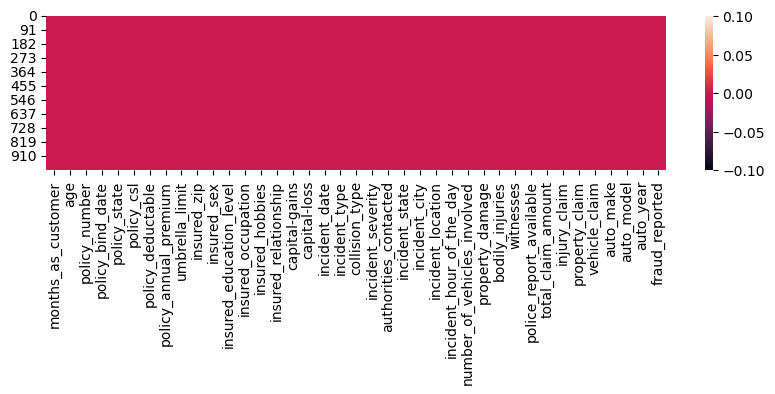

In [14]:
plt.figure(figsize=(10,2))
sns.heatmap(df.isnull())
plt.show()

In [12]:
df.shape

(1000, 39)

In [15]:
# Checking for whitespace, 'NA', '-', or '?'
df.isin([' ', 'NA', '-', ' ?', '?']).any()

months_as_customer             False
age                            False
policy_number                  False
policy_bind_date               False
policy_state                   False
policy_csl                     False
policy_deductable              False
policy_annual_premium          False
umbrella_limit                 False
insured_zip                    False
insured_sex                    False
insured_education_level        False
insured_occupation             False
insured_hobbies                False
insured_relationship           False
capital-gains                  False
capital-loss                   False
incident_date                  False
incident_type                  False
collision_type                  True
incident_severity              False
authorities_contacted          False
incident_state                 False
incident_city                  False
incident_location              False
incident_hour_of_the_day       False
number_of_vehicles_involved    False
p

In [16]:
# Dropping unnecessary columns
df.drop(columns=['policy_number', 'insured_zip','incident_location'],axis=1,inplace=True)

In [17]:
# Replacing ? unique values with np.nan
df['collision_type'].replace('?', np.nan, inplace=True)
df['property_damage'].replace('?', np.nan, inplace=True)
df['police_report_available'].replace('?', np.nan, inplace=True)

In [18]:
# Checking for Missing values
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

                             Missing Values  % Missing data
property_damage                         360            36.0
police_report_available                 343            34.3
collision_type                          178            17.8
auto_model                                0             0.0
auto_make                                 0             0.0
vehicle_claim                             0             0.0
property_claim                            0             0.0
injury_claim                              0             0.0
total_claim_amount                        0             0.0
authorities_contacted                     0             0.0
witnesses                                 0             0.0
bodily_injuries                           0             0.0
auto_year                                 0             0.0
number_of_vehicles_involved               0             0.0
incident_hour_of_the_day                  0             0.0
incident_city                           

In [19]:
#These columns being categorical will use mode to fill null values
df['property_damage'].fillna(df['property_damage'].mode()[0],inplace=True)
df['police_report_available'].fillna(df['police_report_available'].mode()[0],inplace=True)
df['collision_type'].fillna(df['collision_type'].mode()[0],inplace=True)

In [21]:
df.isnull().sum().sum()

0

In [22]:
for i in df.columns:
    print(i)
    print(df[i].value_counts())
    print('*'*50)

months_as_customer
194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
**************************************************
age
43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64
**************************************************
policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64
*******************************************

In [23]:
# Converting Date columns from object type into datetime data type
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

# Extracting Day, Month and Year column from policy_bind_date
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year

# Extracting Day, Month and Year column from incident_date
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

In [24]:
# Since Extraction is done now we can Drop policy_bind_date and incident_date columns
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

In [25]:
df.shape

(1000, 40)

In [26]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,Dodge,RAM,2007,N,9,6,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,Chevrolet,Tahoe,2014,Y,25,5,1990,1,10,2015
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,Accura,RSX,2009,N,6,6,2014,17,2,2015


In [27]:
# Spliting and extracting policy_csl at '/'
df['CSL_Accidental']=df.policy_csl.str.split('/',expand=True)[0]
df['CSL_Overall']=df.policy_csl.str.split('/',expand=True)[1]
# Now we can drop policy_csl column 
df.drop("policy_csl",axis=1,inplace=True)

In [28]:
df.shape

(1000, 41)

### _Observations:_
We addressed the issue with the "policy_csl" column, where numerical data separated by '/' resulted in an object datatype. This column likely represents the Combined Single Limit (CSL) in an insurance policy, combining bodily injury and property damage liability coverage into a single limit. To better capture this information, we performed a split operation on the column, creating two new columns named "CSL_Accidental" and "CSL_Overall." Subsequently, we removed the original "policy_csl" column from our dataframe.

In [29]:
# Separating Numerical & Categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns
numerical_columns = df.select_dtypes(include=['int64']).columns

print(f"We have {len(categorical_columns)} categorical columns in our dataframe")
print('Categorical columns are: ',categorical_columns)
print('\n')
print("We have {} numerical columns in our dataframe".format(len(numerical_columns)))
print('Numerical_columns are: ',numerical_columns)

We have 19 categorical columns in our dataframe
Categorical columns are:  Index(['policy_state', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported', 'CSL_Accidental', 'CSL_Overall'],
      dtype='object')


We have 21 numerical columns in our dataframe
Numerical_columns are:  Index(['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit',
       'capital-gains', 'capital-loss', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'bodily_injuries', 'witnesses',
       'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',
       'auto_year', 'policy_bind_day', 'policy_bind_month', 'policy_bind_year',
       'incident_day', 'incident_month', 'incident_ye

# <span style="color:red;">Data Stats</span>

In [30]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,...,injury_claim,property_claim,vehicle_claim,auto_year,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.0
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,...,7433.420000,7399.570000,37928.950000,2005.103000,15.448000,6.559000,2001.604000,13.08400,3.407000,2015.0
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,...,4880.951853,4824.726179,18886.252893,6.015861,8.850176,3.391758,7.360391,10.44318,3.276291,0.0
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,...,0.000000,0.000000,70.000000,1995.000000,1.000000,1.000000,1990.000000,1.00000,1.000000,2015.0
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,...,4295.000000,4445.000000,30292.500000,2000.000000,8.000000,4.000000,1995.000000,2.00000,1.000000,2015.0
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,...,6775.000000,6750.000000,42100.000000,2005.000000,16.000000,7.000000,2002.000000,15.00000,2.000000,2015.0
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,...,11305.000000,10885.000000,50822.500000,2010.000000,23.000000,9.000000,2008.000000,22.00000,5.000000,2015.0
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,...,21450.000000,23670.000000,79560.000000,2015.000000,31.000000,12.000000,2015.000000,31.00000,12.000000,2015.0


**Observations:**

**Months as Customer:**
- The average patronage duration is around 204 months, indicating long-term relationships with the insurance provider.
- The standard deviation suggests a moderate level of variability in the length of customer patronage.

**Age:**
- Customers' ages range from 19 to 64, with an average age of approximately 39.
- The age distribution appears relatively normal, with a standard deviation of approximately 9 years.

**Policy Deductible:**
- Deductibles vary from 500 to 2000, with an average of 1136.

**Policy Annual Premium:**
- Annual premiums range from 433.33 to 2047.59, with an average of 1256.41.

**Umbrella Limit:**
- The umbrella limit shows a broad range from -1,000,000 to 10,000,000, with negative values requiring further investigation.

**Capital Gains and Losses:**
- Customers exhibit varying capital gains and losses, indicating diverse financial impacts.

**Incident Hour of the Day:**
- Incidents occur throughout the day, with an average incident hour around 11.64.

**Number of Vehicles Involved, Bodily Injuries:**
- Incidents involve 1 to 4 vehicles, with most incidents having 0 or 1 bodily injury.

**Auto Year:**
- Vehicles in the dataset range from 1995 to 2015, showcasing a variety of manufacturing years.

**Policy Bind Day, Month, Year, Incident Day, Month, Year:**
- These columns seem to represent dates related to policy binding and incident occurrences.

**Overall Trends:**
- The dataset is primarily focused on incidents from the year 2015.
- Various features exhibit wide ranges, suggesting diverse customer profiles and incidents.
- These initial observations provide insights for further exploration and preprocessing.

# <span style="color:red;">Data Visualization</span>

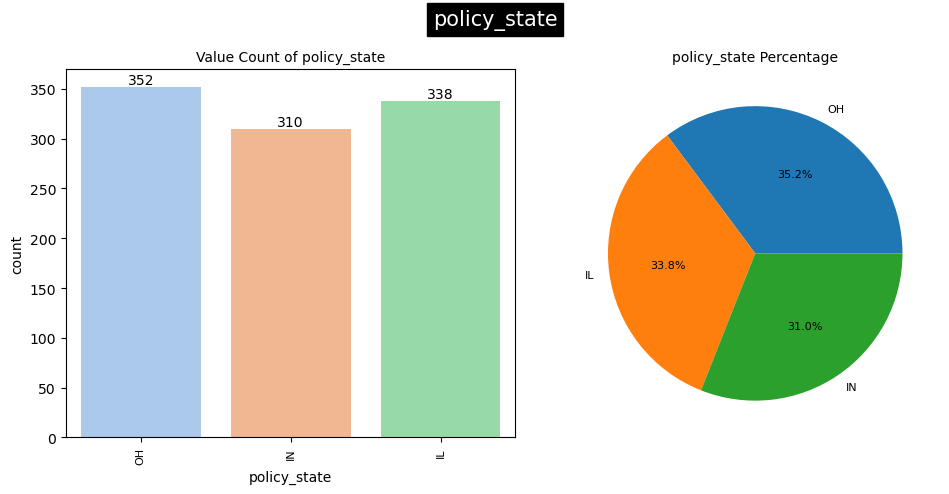

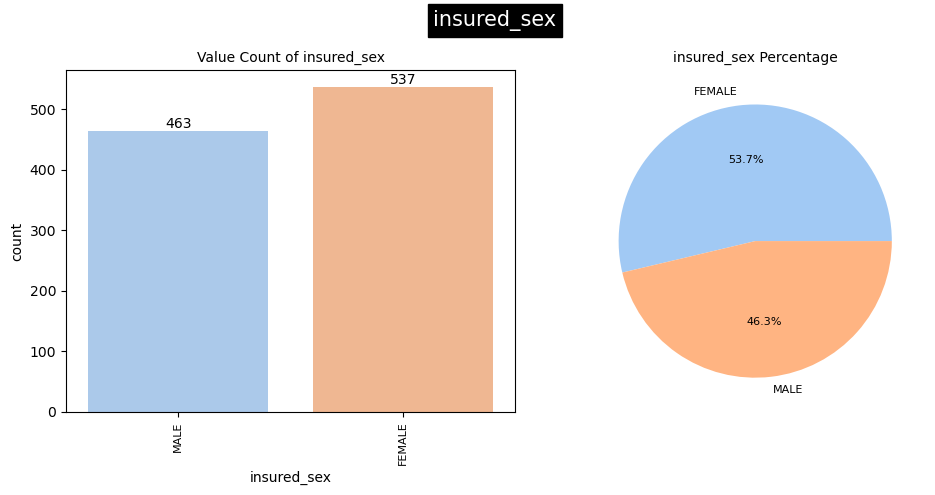

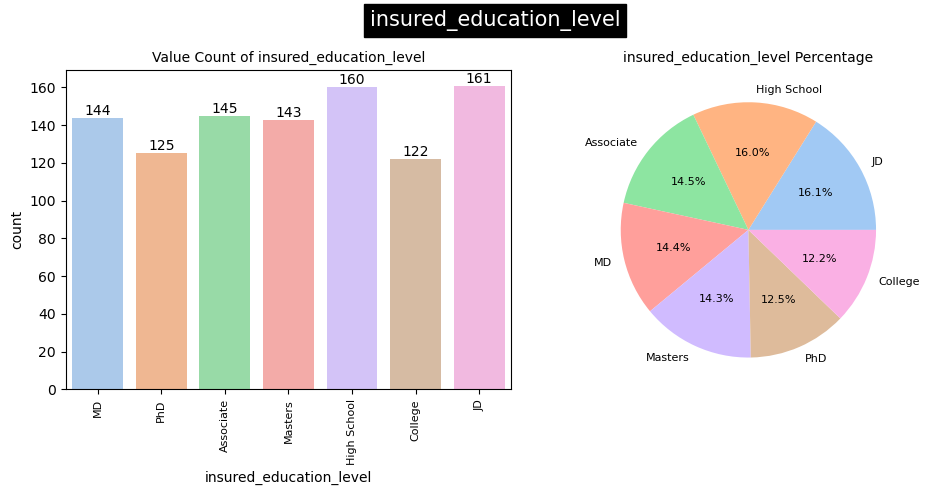

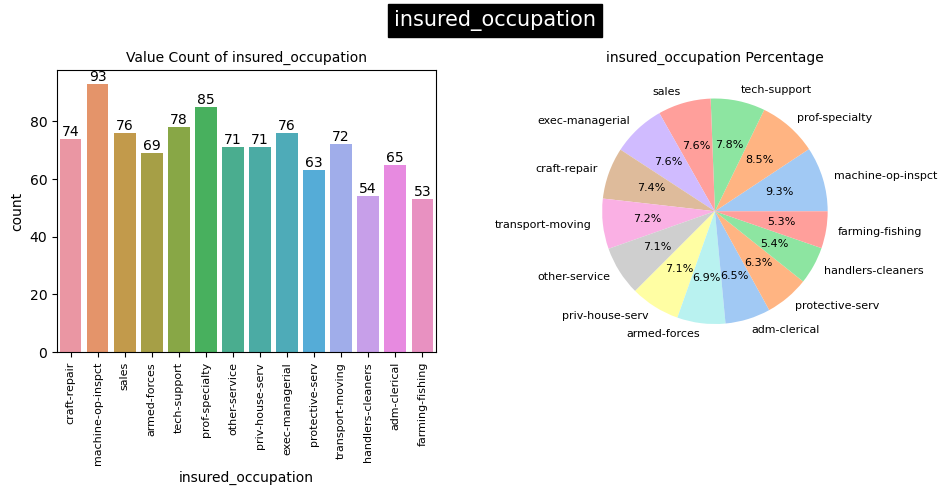

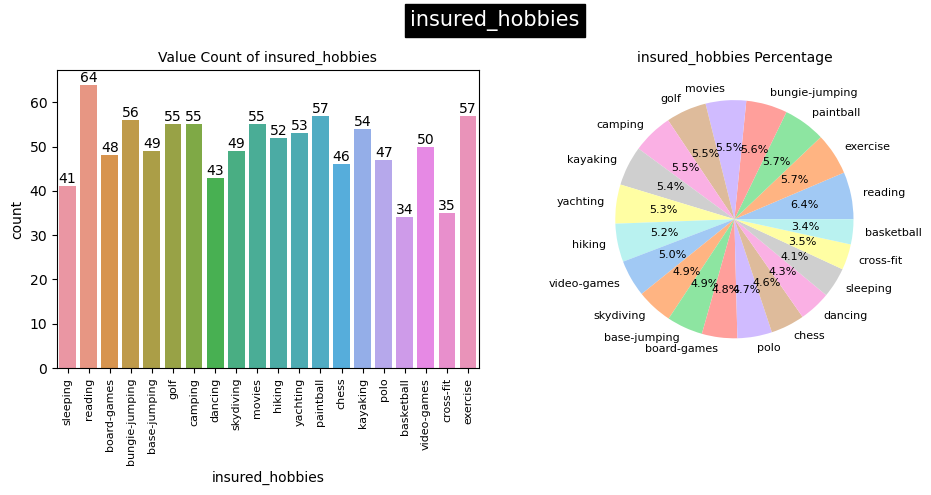

...

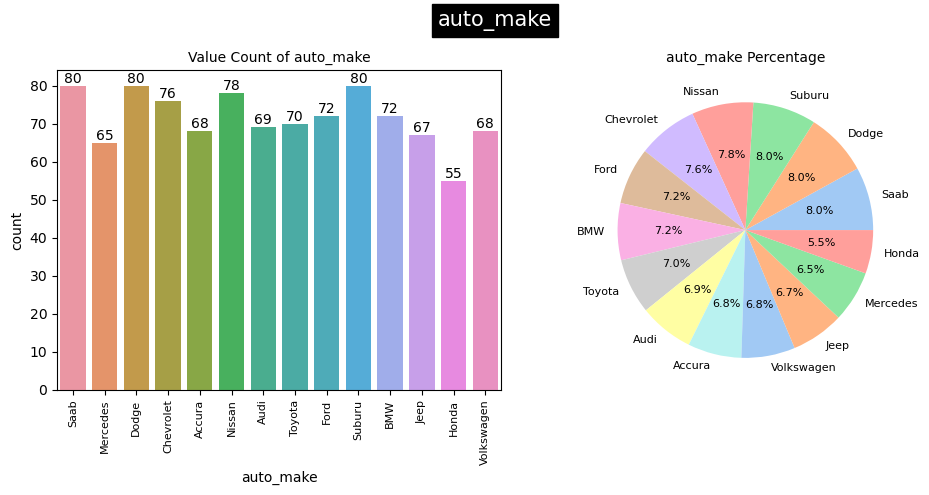

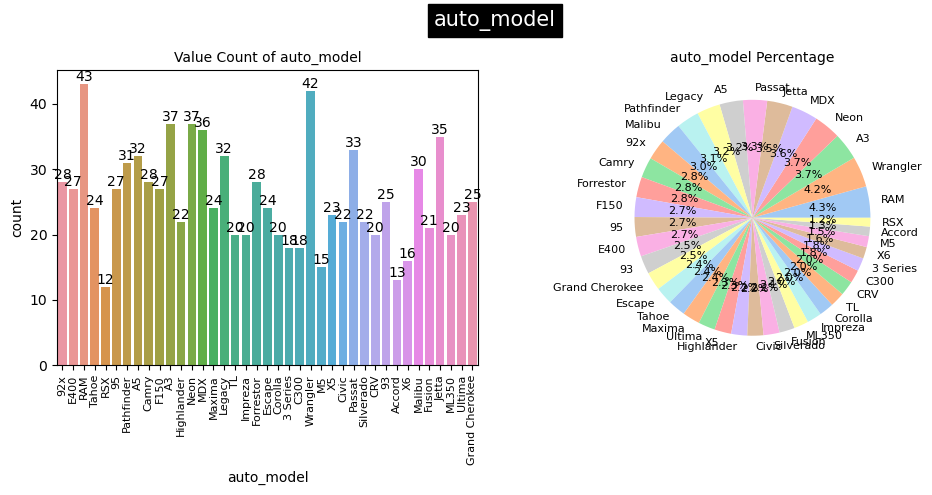

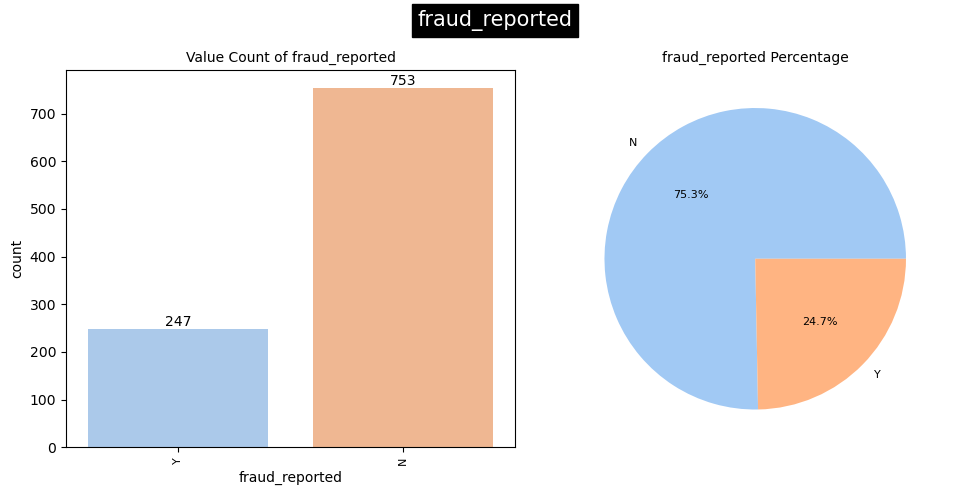

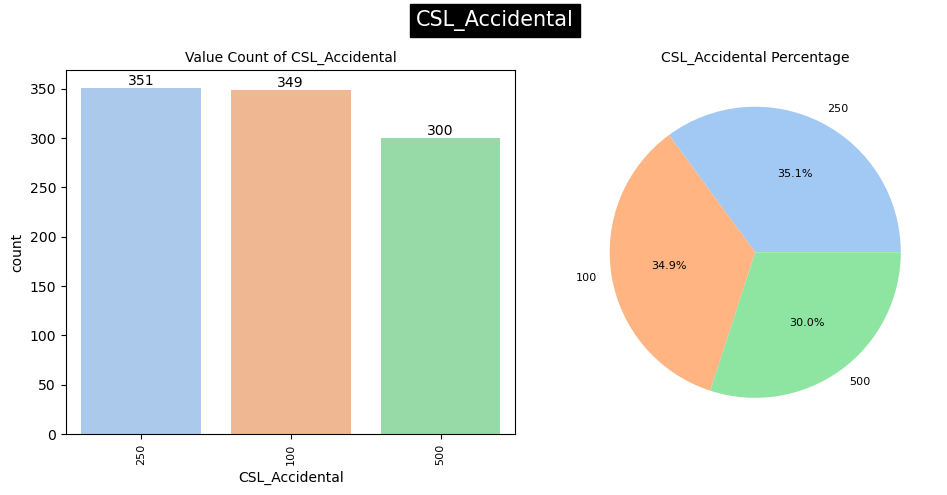

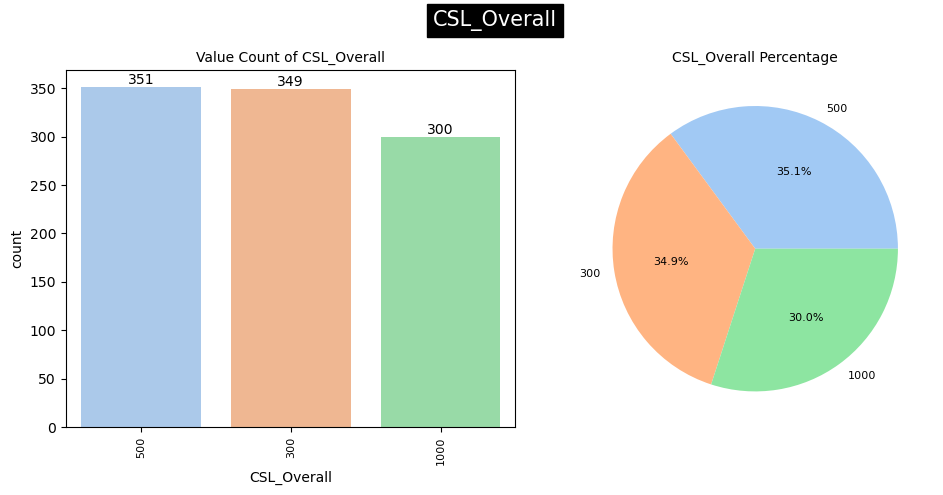

In [31]:
#Iterate over Categorical column
for i, column in enumerate(categorical_columns):
    
    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    sns.set_palette("pastel")
    
    # Plot the countplot
    ax = sns.countplot(x=column, data=df, ax=axes[0])
    for container in ax.containers:
        ax.bar_label(container)
    ax.set_title(f'Value Count of {column}', fontsize=10)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=8)

    # Plot the pie chart
    column_counts = df[column].value_counts()
    ax = axes[1]
    ax.pie(column_counts, labels=column_counts.index, autopct='%0.1f%%', textprops={'fontsize': 8})
    ax.set_title(f'{column} Percentage', fontsize=10)
    
    fig.suptitle(column, fontsize=15, backgroundcolor='black',color='white')
    plt.tight_layout()
    plt.show()

**Observations:**
1. **Policy State:**
   - Dataset includes three states: IL, IN, OH.
   - Ohio (OH) has the highest count (35.2%).

2. **Insured Sex:**
   - Balanced distribution.
   - Females: 53.7%, Males: 46.3%.

3. **Insured Education:**
   - Varied levels.
   - 'JD' and 'MD' around 16.1%, 'PhD' lowest at 12.5%.

4. **Insured Occupation:**
   - Diverse occupations.
   - 'Exec-managerial' and 'Craft-repair' prominent.

5. **Incident Type:**
   - 'Multi-vehicle' and 'Single Vehicle' collisions dominate.

6. **Incident Severity:**
   - Four categories.
   - 'Minor Damage' highest at 35.4%.

7. **Authorities Contacted:**
   - 'Police' most contacted (29.2%).

8. **Incident State:**
   - Occurrences in different states.
   - 'SC' and 'WV' highest.

9. **Property Damage:**
   - 69.8% no property damage.

10. **Police Report:**
    - 68.6% no report.

11. **Fraud Reported:**
    - Imbalanced dataset.
    - 75.3% 'N' (No fraud).
    
12. **CSL Details:**
>  **CSL Accidental:**
   - Categories 100, 250, 500.

>  **CSL Overall:**
   - Consistent distribution with 'CSL_Accidental.'


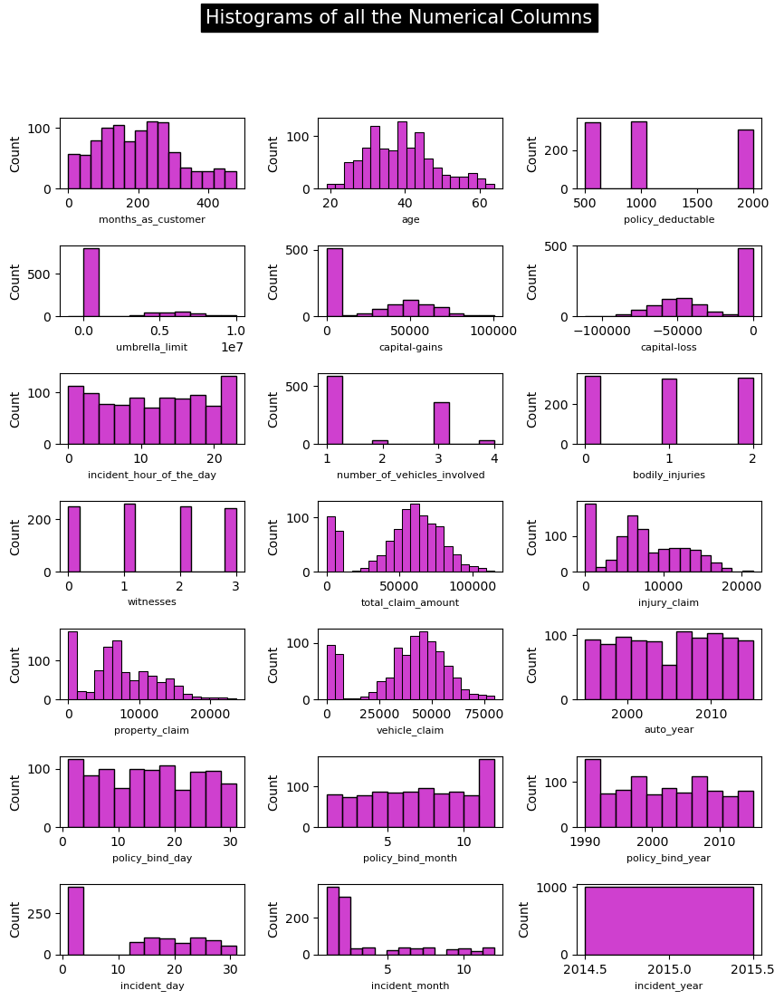

In [32]:
# iterate over numerical column
plt.figure(figsize=(10,12), facecolor='white')
plotnumber = 1

for column in numerical_columns:
    if plotnumber <= 21:
        ax = plt.subplot(7, 3, plotnumber)
        sns.histplot(df[column], color='m')
        plt.xlabel(column, fontsize=8)
    plotnumber += 1

plt.subplots_adjust(wspace=0.4, hspace=0.8)
plt.suptitle("Histograms of all the Numerical Columns", fontsize=15, backgroundcolor='black', color='white')
plt.show()

**Observations:**

1. **Months as Customer:**
   - Widely varying distribution, with a peak at 194 months (8 occurrences).
   - Indicates diversity in customer relationship durations.

2. **Age:**
   - Peak at 43 with 49 occurrences.
   - Diverse age range from 19 to 64.

3. **Policy Deductible:**
   - Most frequent at 1000 (351 occurrences).
   - Significant occurrences for 500 and 2000 (342 and 307, respectively).

4. **Umbrella Limit:**
   - Majority with a limit of 0 (798 occurrences).
   - Other limits vary with few occurrences in the millions.

5. **Capital Gains and Losses:**
   - Diverse values, common gains at 0 and 59400.
   - Common losses include -31700, -53700, -50300.

6. **Incident Hour of the Day:**
   - Spread out distribution with a peak at 17 (54 occurrences).
   - Relatively even distribution across different hours.

7. **Number of Vehicles Involved:**
   - Most involve 1 or 3 vehicles (581 and 358 occurrences).
   - Involvement of 2 or 4 vehicles is less frequent.

8. **Bodily Injuries and Witnesses:**
   - Balanced distribution for 0, 1, and 2 occurrences.

9. **Claim Amounts (Injury, Property, Vehicle):**
   - Wide variation in total claim amounts, common value at 59400.
   - Diverse patterns for injury, property, and vehicle claim amounts.

10. **Auto Year:**
    - Range from 1995 to 2015.
    - Common occurrences in 1995, 1999, and 2005.

11. **Policy Bind Day and Month:**
    - Diverse patterns with various frequencies.

12. **Policy Bind Year:**
    - Most policies bound in 1991, 2002, and 1992.

13. **Incident Day and Month:**
    - Diverse patterns with various frequencies.

14. **Incident Year:**
    - All incidents occurred in the year 2015.

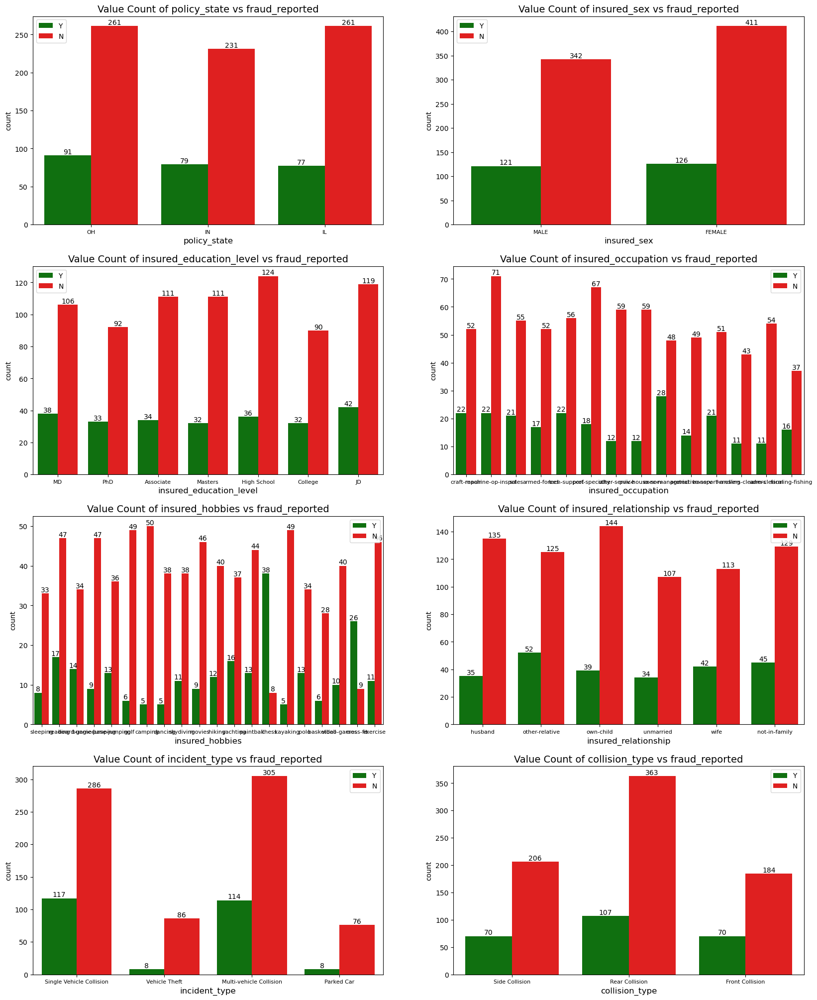

In [33]:
# Comparing Target column with Categorical Columns

cat_col= categorical_columns.drop('fraud_reported')

plt.figure(figsize=(20,25))
p=1

for i in cat_col:
    if p<=8:
        plt.subplot(4,2,p)
        custom_palette = {"Y": "green", "N": "red"} ## Define a custom color palette
        ax= sns.countplot(x=i, hue='fraud_reported',data=df, palette=custom_palette)
        for container in ax.containers:
            ax.bar_label(container)
        plt.title(f'Value Count of {i} vs fraud_reported', fontsize=14)
        plt.xlabel(i, fontsize=12)
        plt.xticks(fontsize=8)
        plt.legend()
    p+=1
plt.show()

**Observations:**

1. **Policy State:**
   - Highest fraud reports (Y) in policy states IL, IN, and OH.
   - Policy state OH has the highest percentage of fraud reports.

2. **Insured Sex:**
   - More female policyholders in non-fraudulent cases (N).
   - More balanced distribution of sex in fraudulent cases (Y).

3. **Insured Education Level:**
   - Similar distribution of education levels for both non-fraudulent and fraudulent cases.
   - Common education levels include Associate, High School, JD, and Masters.

4. **Insured Occupation:**
   - Shift in occupations for fraudulent cases towards exec-managerial, tech-support, and sales.
   - Non-fraudulent cases have more common occupations like adm-clerical, armed-forces, and craft-repair.

5. **Insured Hobbies:**
   - Shift in hobbies for fraudulent cases towards chess, cross-fit, and skydiving.
   - Non-fraudulent cases have more prevalent hobbies like base-jumping, camping, and dancing.

6. **Insured Relationship:**
   - Relatively balanced distribution for insured relationships in both cases.
   - Husband and own-child relationships are more common in both non-fraudulent and fraudulent cases.

7. **Incident Type:**
   - Multi-vehicle collisions and single-vehicle collisions more common in both cases.
   - Parked car incidents less common but with a higher percentage in non-fraudulent cases.

8. **Collision Type:**
   - Rear collisions most common in both cases.
   - Front and side collisions more evenly distributed.

9. **Incident Severity:**
   - Non-fraudulent cases have more common minor damage and total loss incidents.
   - Fraudulent cases have more prevalent major damage incidents.

10. **Authorities Contacted:**
    - Most cases involve contacting the police in both fraudulent and non-fraudulent cases.
    - Non-fraudulent cases have higher percentages of contacting fire and ambulance.

11. **Incident State and City:**
    - Distribution of incident states and cities varies with different percentages of fraud.

12. **Property Damage:**
    - Cases with property damage have higher percentages of fraud, but the overall distribution is relatively balanced.

13. **Police Report Available:**
    - Fraudulent cases have a lower percentage of police reports available.

14. **Auto Make and Model:**
    - Distribution of auto make and model varies, with some having higher percentages of fraud.

15. **CSL (Combined Single Limit):**
    - Different CSL levels show varying percentages of fraud, but no clear trend.

16. **Overall CSL:**
    - Different overall CSL levels show varying percentages of fraud, but no clear trend.

These observations offer insights into the distribution of features and their relation to fraud reports. Interpretation may vary based on the insurance domain context.

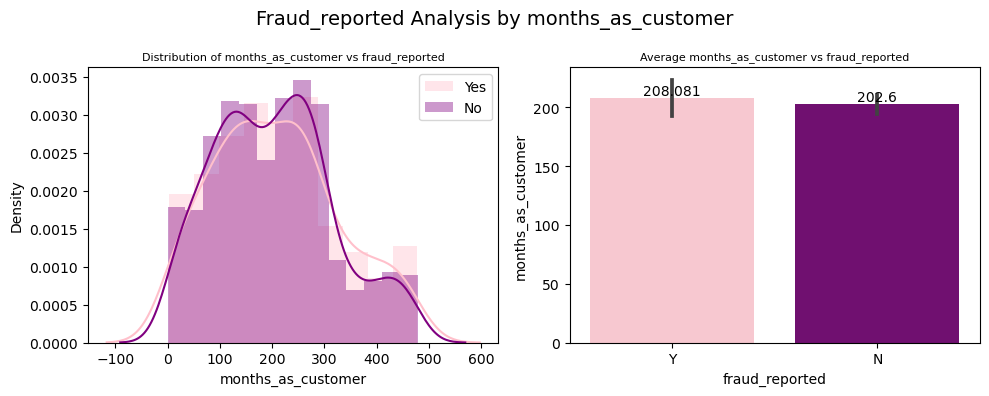

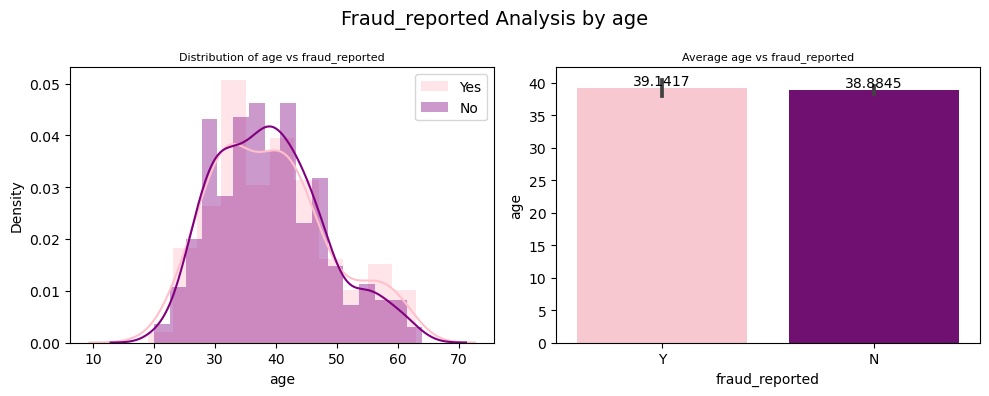

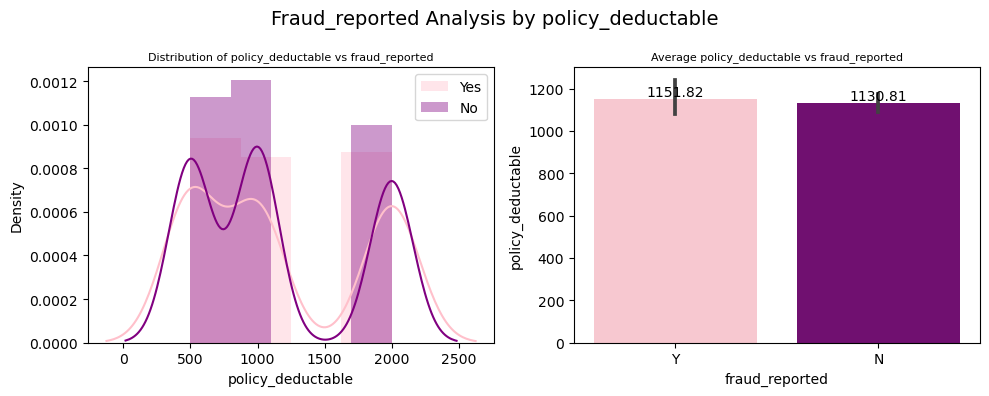

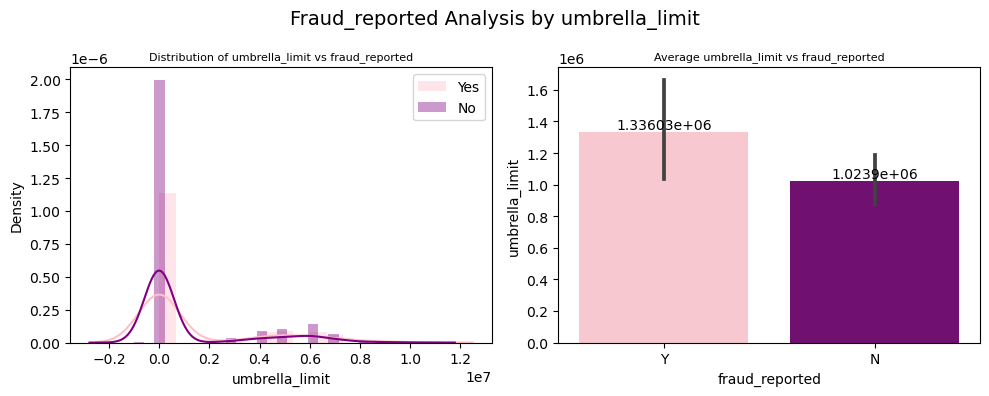

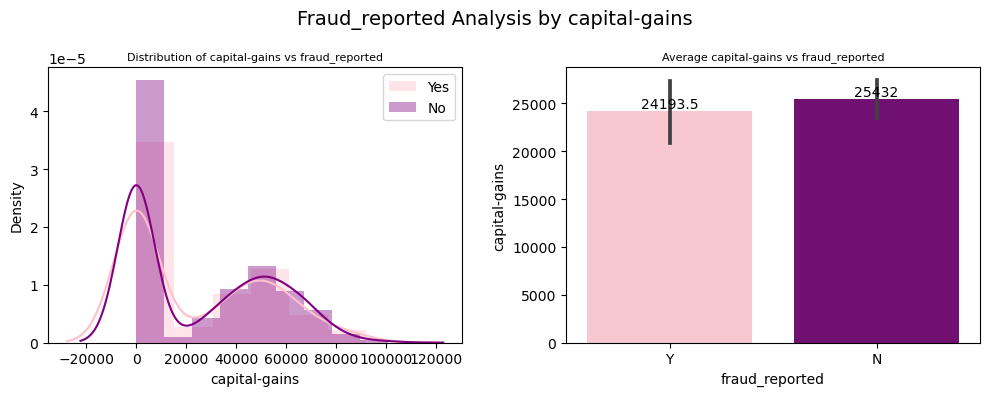

...

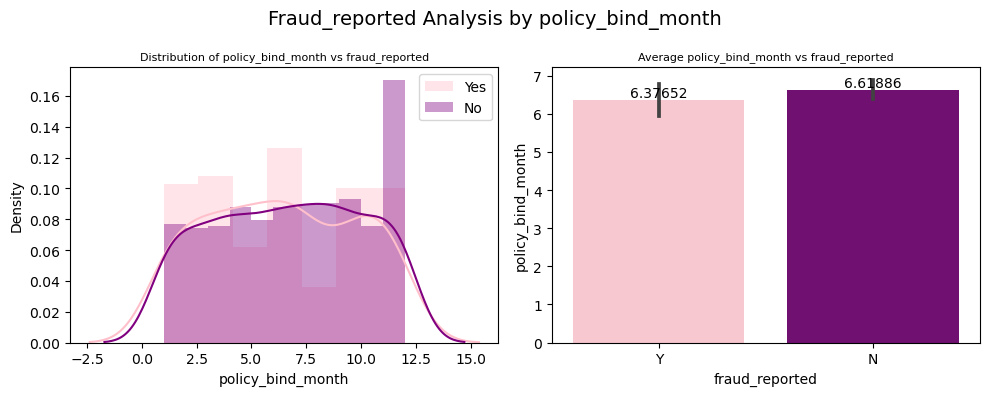

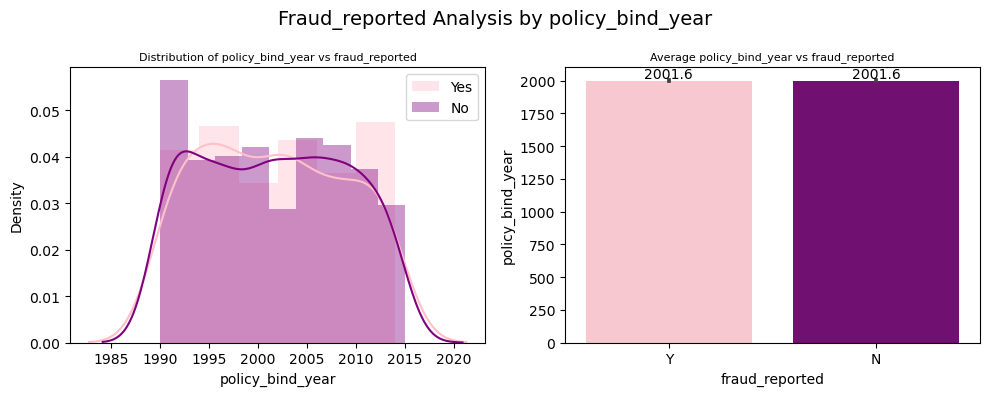

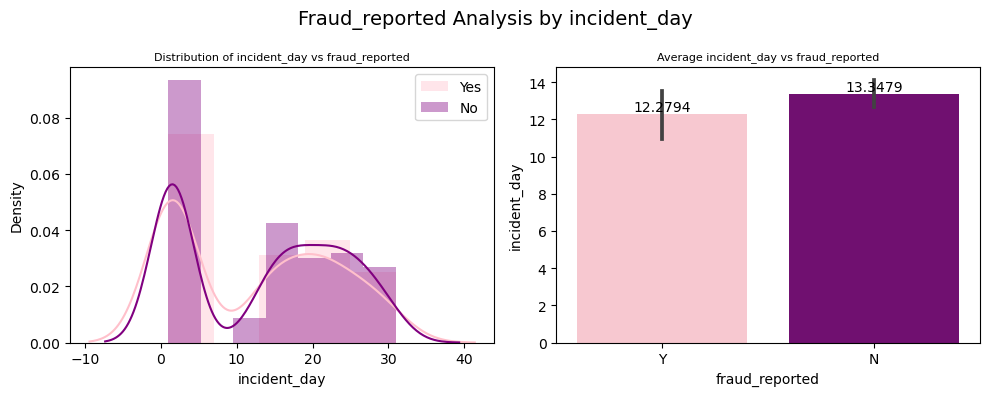

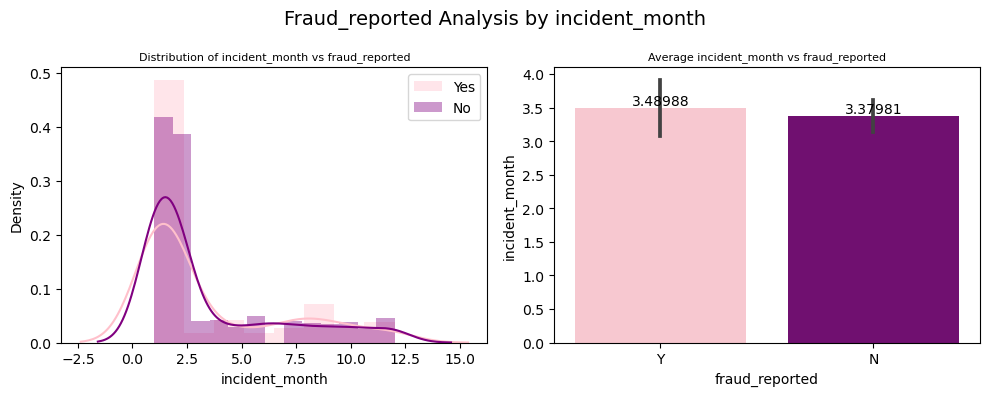

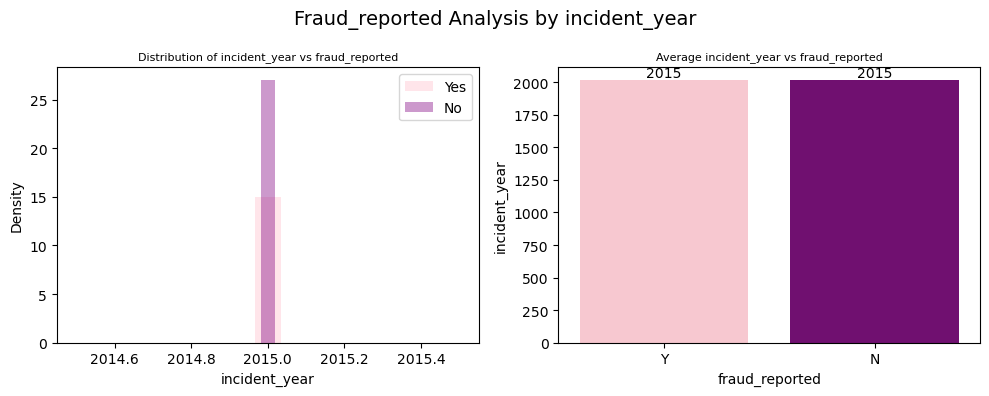

In [38]:
# Comparing Target column with Numerical Columns
for i in numerical_columns:
    
    #create Subplots
    fig, axes =plt.subplots(1,2,figsize=(10,4))
    
    # First Plot: Distribution of Numerical columns vs fraud_reported
    sns.distplot(df[df['fraud_reported']=="Y"][i], label= "Yes", color='pink', ax=axes[0])
    sns.distplot(df[df['fraud_reported']=="N"][i],label="No", color='purple', ax=axes[0])
    axes[0].set_title(f"Distribution of {i} vs fraud_reported", fontsize=8)
    axes[0].legend()
    
    # Second Plot: Avg. Numerical columns vs fraud_reported
    ax=sns.barplot(x='fraud_reported', y=i, data=df, palette={"Y": "pink", "N": "purple"}, ax=axes[1])
    for container in ax.containers:
        ax.bar_label(container)
    axes[1].set_title(f'Average {i} vs fraud_reported',fontsize=8)
    
    fig.suptitle(f"Fraud_reported Analysis by {i}", fontsize=14, color='black')  # Add a specific title for this column
    
    # Adjust layout to prevent overlapping
    plt.tight_layout()
    # Show the plots
    plt.show()

**Observations:**

1. **Months as Customer:**
   - Majority of fraud cases reported in early months of customer relationships.
   - Fraud percentage tends to decrease with increasing months as a customer.

2. **Age:**
   - Higher percentage of reported fraud cases involve younger individuals.
   - Fraud percentage generally decreases with increasing age.

3. **Policy Deductible:**
   - Lower policy deductibles (e.g., 500) have higher fraud percentages.
   - Higher deductibles show lower fraud percentages.

4. **Umbrella Limit:**
   - Most fraud cases have an umbrella limit of 0.
   - Higher limits (e.g., 6,000,000) show varying percentages, generally with lower limits having higher fraud percentages.

5. **Capital Gains and Losses:**
   - No clear pattern for fraud cases based on capital gains or losses.

6. **Incident Hour of the Day:**
   - Higher percentage of fraud cases during late evening and early morning hours.
   - Variations across different hours.

7. **Number of Vehicles Involved:**
   - Fraud cases more likely to involve fewer vehicles.

8. **Bodily Injuries and Witnesses:**
   - No clear pattern in relation to fraud cases.

9. **Claim Amounts:**
   - No clear pattern for fraud cases in total claim amount, injury claim, property claim, or vehicle claim.

10. **Auto Year:**
    - Higher percentage of fraud cases in older and newer auto years compared to mid-range years.

11. **Policy Bind and Incident Dates:**
    - No clear pattern for fraud cases based on policy bind or incident dates.

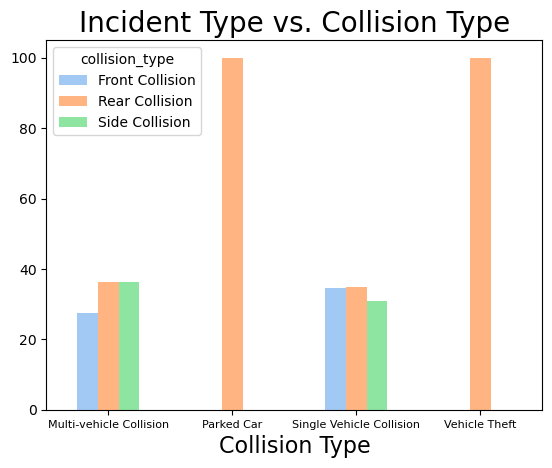

In [40]:
# Comparing incident_type & collision_type
cross_table = pd.crosstab(df['incident_type'], df['collision_type'])
percentage_table = cross_table.div(cross_table.sum(axis=1), axis=0) * 100

percentage_table.plot(kind='bar')
plt.title('Incident Type vs. Collision Type', fontsize=20)
plt.xlabel('Collision Type', fontsize=16)
plt.xticks(fontsize=8, rotation=0)
plt.show()

**Observations:**

1. **Multi-vehicle Collision:**
   - Front Collision: Approximately 27.45%.
   - Rear Collision: Approximately 36.28%.
   - Side Collision: Approximately 36.28%.
   - Relatively even distribution among front, rear, and side collision types.

2. **Parked Car:**
   - Front Collision: 0% (No instances).
   - Rear Collision: 100%.
   - Side Collision: 0%.
   - Exclusively involves rear collisions.

3. **Single Vehicle Collision:**
   - Front Collision: Approximately 34.49%.
   - Rear Collision: Approximately 34.74%.
   - Side Collision: Approximately 30.77%.
   - Relatively balanced distribution among front, rear, and side collision types.

4. **Vehicle Theft:**
   - Front Collision: 0% (No instances).
   - Rear Collision: 100%.
   - Side Collision: 0%.
   - Exclusively involves rear collisions.

These insights highlight the predominant collision types associated with different incident scenarios. For instance, incidents involving parked cars are overwhelmingly rear collisions, while multi-vehicle collisions exhibit a more balanced distribution among collision types. Consideration of these patterns is crucial in the context of insurance claims and risk assessment.


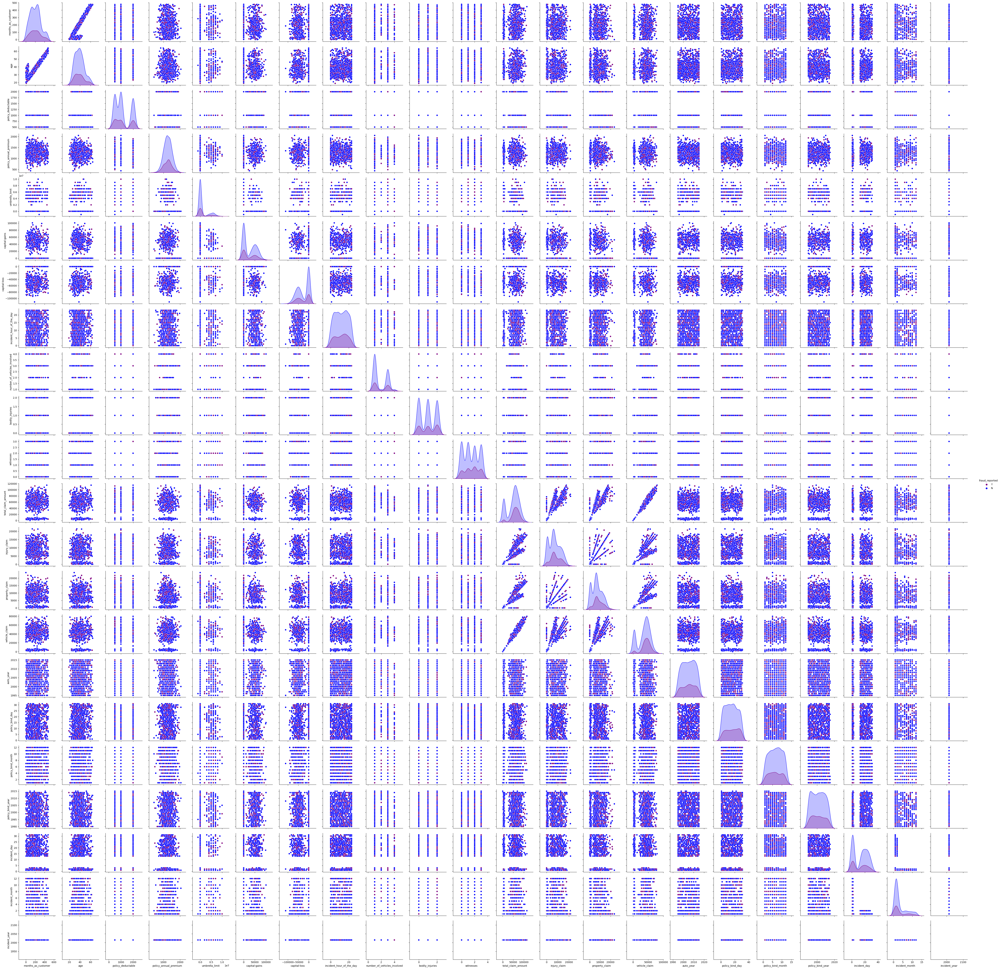

In [41]:
sns.pairplot(df, hue='fraud_reported', palette={'N': 'blue', 'Y': 'purple'})
plt.show()

# <span style="color:red;">Outlier Detection & Removal</span>

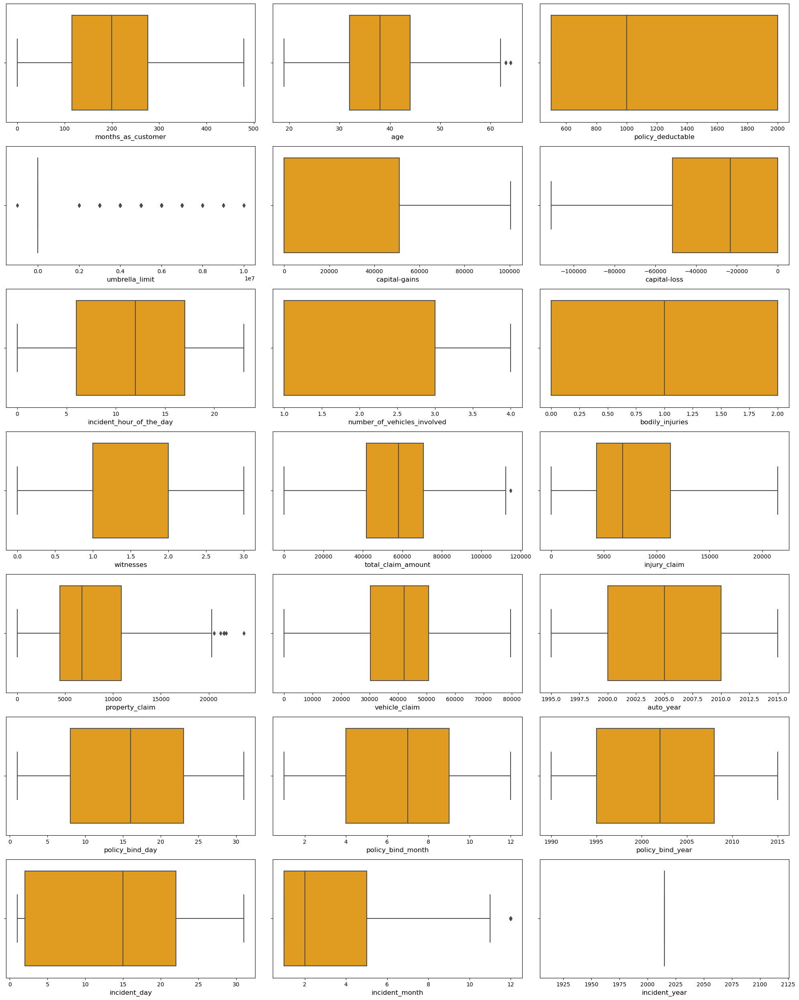

In [42]:
# Identifying the outliers present in numerical columns using boxplot
plt.figure(figsize=(20,25))
plotnumber=1
for col in numerical_columns:
    if plotnumber<=21:
        ax=plt.subplot(7,3,plotnumber)
        sns.boxplot(x=col, data=df,color='orange')
        plt.xlabel(col,fontsize=12)
    plotnumber+=1
plt.tight_layout()

In [43]:
# Creating a list with Columns which has outliers
outlier_columns=['age', 'umbrella_limit', 'total_claim_amount',
                 'property_claim','incident_month']


# Calculate the z-scores for the specified numerical columns
z = np.abs(zscore(df[outlier_columns]))

# Create a new DataFrame df1 with rows where z-scores are less than 3 for all numerical columns
df1 = df[(z < 3).all(axis=1)]
df1.shape

(984, 41)

In [44]:
df=df1
df.shape

(984, 41)

# <span style="color:red;">skewness detection & removal</span>

In [45]:
df.skew()

months_as_customer             0.367631
age                            0.479110
policy_deductable              0.476678
policy_annual_premium          0.006813
umbrella_limit                 1.807983
capital-gains                  0.468503
capital-loss                  -0.387231
incident_hour_of_the_day      -0.033180
number_of_vehicles_involved    0.507624
bodily_injuries                0.007491
witnesses                      0.019974
total_claim_amount            -0.595817
injury_claim                   0.266380
property_claim                 0.357371
vehicle_claim                 -0.622346
auto_year                     -0.054037
policy_bind_day                0.024071
policy_bind_month             -0.025940
policy_bind_year               0.058506
incident_day                   0.059036
incident_month                 1.387197
incident_year                  0.000000
CSL_Accidental                 0.418292
CSL_Overall                    0.615083
dtype: float64

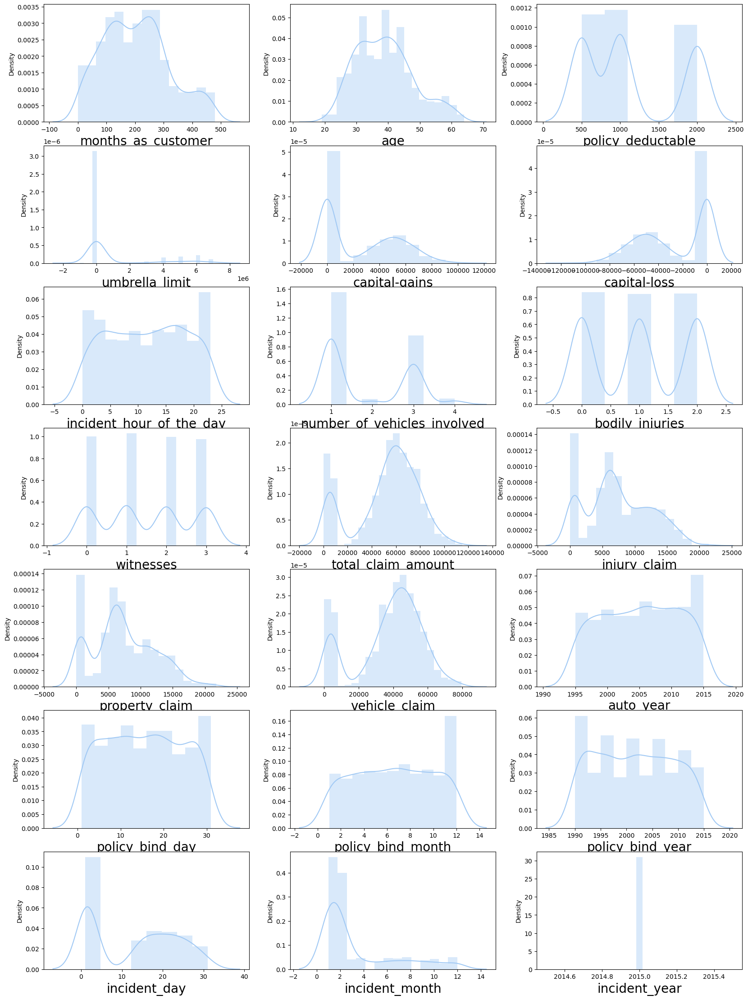

In [46]:
plt.figure(figsize=(20,40),facecolor='white')
plotnum=1
for col in numerical_columns:
    if plotnum<=21:
        plt.subplot(10,3,plotnum)
        sns.distplot(df[col])
        plt.xlabel(col,fontsize=20)
    plotnum+=1
plt.show()

In [49]:
#Treating Skewness
positive_skew_features = ['age', 'policy_deductable', 'incident_month','umbrella_limit','CSL_Overall']
negative_skew_features = ['total_claim_amount', 'vehicle_claim']

# using PowerTransformer
scaler = PowerTransformer()
df[positive_skew_features + negative_skew_features] = scaler.fit_transform(df[positive_skew_features + negative_skew_features])
skewness_after_transform = df.skew()
print(skewness_after_transform)

months_as_customer             0.367631
age                           -0.001921
policy_deductable              0.022028
policy_annual_premium          0.006813
umbrella_limit                -7.960483
capital-gains                  0.468503
capital-loss                  -0.387231
incident_hour_of_the_day      -0.033180
number_of_vehicles_involved    0.507624
bodily_injuries                0.007491
witnesses                      0.019974
total_claim_amount            -0.510286
injury_claim                   0.266380
property_claim                 0.357371
vehicle_claim                 -0.523054
auto_year                     -0.054037
policy_bind_day                0.024071
policy_bind_month             -0.025940
policy_bind_year               0.058506
incident_day                   0.059036
incident_month                 0.306178
incident_year                  0.000000
CSL_Accidental                 0.418292
CSL_Overall                    0.111859
dtype: float64


**Observations:**

- Skewness Reduction:
  - Features like "months_as_customer," "age," and "policy_deductable" show reduced skewness after applying the PowerTransformer.
  - The transformations have made the distributions of these features more symmetric.

- Significant Reduction:
  - The "umbrella_limit" feature exhibits a notable reduction in skewness, indicating a substantial improvement in symmetry.

- Balanced Distribution:
  - "incident_month" has experienced a decrease in skewness, contributing to a more balanced distribution.

- Minor Change:
  - Some features, such as "CSL_Overall," show a minor change in skewness, but overall, the transformations have been effective.

- Skewness Close to Zero:
  - Features with skewness close to zero after transformation are considered to have achieved a more symmetrical distribution.

The PowerTransformer has successfully reduced skewness in various features, contributing to an overall more balanced dataset.


# <span style="color:red;">Encoding Categorical Columns</span>

In [50]:
le = LabelEncoder()

for i in categorical_columns:
    df[i] = le.fit_transform(df[i])

df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year,CSL_Accidental,CSL_Overall
0,328,1.005386,2,0.062875,1406.91,-0.336103,1,4,2,17,...,2004,1,17,10,2014,25,-1.101331,2015,1,1
1,228,0.430592,1,1.272274,1197.22,1.485696,1,4,6,15,...,2007,1,27,6,2006,21,-1.101331,2015,1,1
2,134,-1.134199,2,1.272274,1413.14,1.485696,0,6,11,2,...,2007,0,9,6,2000,22,-0.022281,2015,0,0
3,256,0.327446,0,1.272274,1415.74,1.792088,0,6,1,2,...,2014,1,25,5,1990,1,1.557273,2015,1,1
4,228,0.630221,0,0.062875,1583.91,1.792088,1,0,11,2,...,2009,0,6,6,2014,17,-0.022281,2015,2,2


# <span style="color:red;">Correlation</span>

In [51]:
df_cor = df.corr()
df_cor

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year,CSL_Accidental,CSL_Overall
months_as_customer,1.000000,0.907304,-0.005464,0.022633,0.001671,-0.000735,0.060180,-0.000698,0.009223,-0.089496,...,-0.001069,0.019937,0.049922,0.004172,-0.043360,-0.010029,0.016046,NaN,-0.023510,-0.023510
age,0.907304,1.000000,-0.020976,0.023541,0.018799,-0.002516,0.070078,0.004301,0.018585,-0.079958,...,0.004719,0.005679,0.049408,0.014327,-0.032852,0.000815,0.015611,NaN,-0.015367,-0.015367
policy_state,-0.005464,-0.020976,1.000000,0.015941,0.015053,-0.030787,-0.018071,-0.029045,-0.024229,-0.038660,...,-0.000891,0.035856,-0.000504,0.074212,-0.005403,0.018881,0.025571,NaN,0.001450,0.001450
policy_deductable,0.022633,0.023541,0.015941,1.000000,0.001287,0.032337,-0.010747,0.010493,-0.058004,-0.013557,...,0.025819,0.004727,-0.001318,-0.048797,-0.054910,-0.025064,-0.000345,NaN,0.008327,0.008327
policy_annual_premium,0.001671,0.018799,0.015053,0.001287,1.000000,-0.015522,0.036474,-0.019624,0.031318,-0.017144,...,-0.052489,-0.018216,-0.024728,-0.039285,0.003333,0.014723,-0.005048,NaN,0.027909,0.027909
umbrella_limit,-0.000735,-0.002516,-0.030787,0.032337,-0.015522,1.000000,-0.007253,0.007658,0.007242,-0.029678,...,0.050670,0.045945,-0.000142,0.014166,0.055108,-0.055508,0.053835,NaN,0.033060,0.033060
insured_sex,0.060180,0.070078,-0.018071,-0.010747,0.036474,-0.007253,1.000000,0.011604,-0.006188,-0.020651,...,-0.031610,0.019295,0.042158,-0.000432,-0.032415,-0.017282,0.036139,NaN,-0.004691,-0.004691
insured_education_level,-0.000698,0.004301,-0.029045,0.010493,-0.019624,0.007658,0.011604,1.000000,-0.024134,0.024192,...,0.052700,0.010356,0.017076,-0.011564,0.018051,-0.054532,0.066251,NaN,0.007090,0.007090
insured_occupation,0.009223,0.018585,-0.024229,-0.058004,0.031318,0.007242,-0.006188,-0.024134,1.000000,-0.011381,...,-0.002809,-0.002685,0.002241,0.021921,-0.026845,-0.022174,0.011180,NaN,0.014212,0.014212
insured_hobbies,-0.089496,-0.079958,-0.038660,-0.013557,-0.017144,-0.029678,-0.020651,0.024192,-0.011381,1.000000,...,-0.016177,-0.046404,0.034572,-0.003290,-0.021306,0.017860,-0.003549,NaN,-0.003000,-0.003000


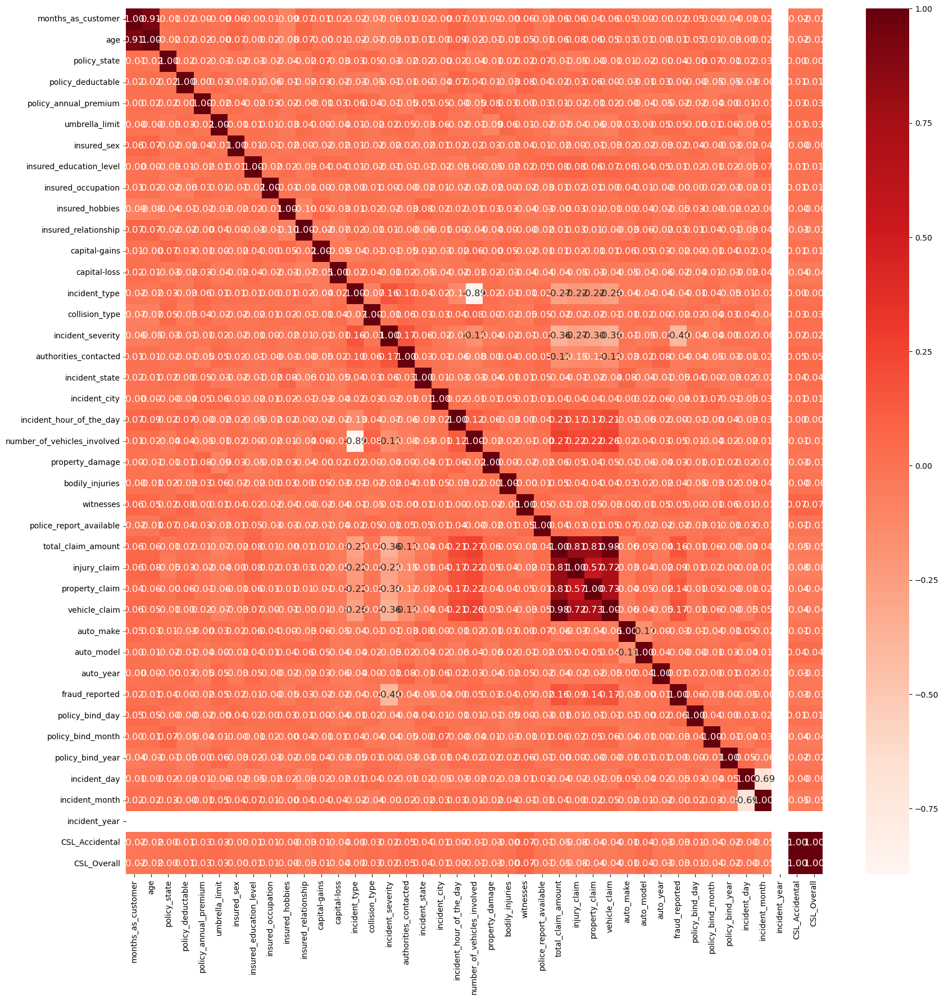

In [54]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_cor, annot=True, fmt='.2F', cmap='Reds', annot_kws={"size": 12})
plt.show()

Observations:
- **High Positive Correlation:**
  - "months_as_customer" and "age" exhibit a very high positive correlation of approximately 0.91, indicating that as the number of months a customer has been associated with the insurance company increases, so does their age.
  
- **Moderate Positive Correlation:**
  - "insured_sex" and "insured_occupation" show a positive correlation of 0.06, suggesting a slight tendency for certain occupations to be associated with a specific gender.
  
- **High Negative Correlation:**
  - "umbrella_limit" and "total_claim_amount" have a significant negative correlation of approximately -0.07, suggesting that higher umbrella limits may be associated with lower total claim amounts.
  
- **Moderate Negative Correlation:**
  - "umbrella_limit" and "auto_year" display a negative correlation of -0.05, suggesting a modest relationship between the umbrella limit and the year of the insured vehicle.
  
- **Variables Correlated with "CSL_Accidental" and "CSL_Overall":**
  - Several variables exhibit positive and negative correlations with "CSL_Accidental" and "CSL_Overall." These variables include "age," "policy_deductable," "witnesses," and others. These correlations may indicate relationships with the type of bodily injury coverage.
  
- **Year-Related Variables:**
  - "auto_year" and "policy_bind_year" show a moderate negative correlation of -0.05, indicating a tendency for more recent policy bindings to be associated with newer vehicles.
  
- **Fraud Reporting Related:**
  - "fraud_reported" does not show strong correlations with many variables, indicating that the decision to report fraud is not highly correlated with other specific features.
  
- **Incident Date Correlation:**
  - "incident_day" and "incident_month" have a negative correlation of approximately -0.69, suggesting a certain degree of temporal correlation.
  
- **Correlation with Itself (NaN Values):**
  - "incident_year" and "CSL_Accidental" or "CSL_Overall" have NaN values, as they are perfectly correlated with themselves.
  
- **Weak Correlations:**
  - Several variables have weak correlations with one another, indicating a lack of strong linear relationships.

These observations provide insights into the relationships between different features in the dataset, which can be valuable for feature selection and further analysis.

In [55]:
# Highly correlated with each other
correlation_threshold = 0.80
mask = df_cor.abs() >= correlation_threshold
features_to_drop = set()
for i in range(len(df_cor.columns)):
    for j in range(i+1, len(df_cor.columns)):
        if mask.iloc[i, j]:
            colname_i = df_cor.columns[i]
            colname_j = df_cor.columns[j]
            if colname_i not in features_to_drop:
                features_to_drop.add(colname_j)

In [56]:
features_to_drop

{'CSL_Overall',
 'age',
 'injury_claim',
 'number_of_vehicles_involved',
 'property_claim',
 'vehicle_claim'}

In [57]:
# dropping irrelevant columns
df.drop(columns=['CSL_Overall', 'age', 
                 'injury_claim', 'number_of_vehicles_involved',
                 'property_claim', 'vehicle_claim'],axis=1,inplace=True)

In [58]:
df.shape

(984, 35)

We found that 6 of the columns in the dataframe exhibit a high correlation of 80% or more with each other, so we have dropped those columns. Now, we have 35 columns and 984 rows in our dataframe.

In [59]:
# correlation with target column(fraud_reported)
correlation_with_fraud = df.corr()['fraud_reported'].abs().sort_values(ascending=False)
print(correlation_with_fraud)

fraud_reported              1.000000
incident_severity           0.402543
total_claim_amount          0.162458
policy_bind_day             0.064302
incident_day                0.054236
incident_state              0.051058
witnesses                   0.048186
insured_hobbies             0.046404
umbrella_limit              0.045945
authorities_contacted       0.044275
incident_type               0.042407
incident_city               0.041869
bodily_injuries             0.037510
policy_state                0.035856
policy_bind_month           0.032485
CSL_Accidental              0.030189
insured_relationship        0.028958
auto_make                   0.027640
property_damage             0.025788
police_report_available     0.019966
months_as_customer          0.019937
insured_sex                 0.019295
collision_type              0.019182
policy_annual_premium       0.018216
capital-loss                0.017589
capital-gains               0.015834
insured_education_level     0.010356
a

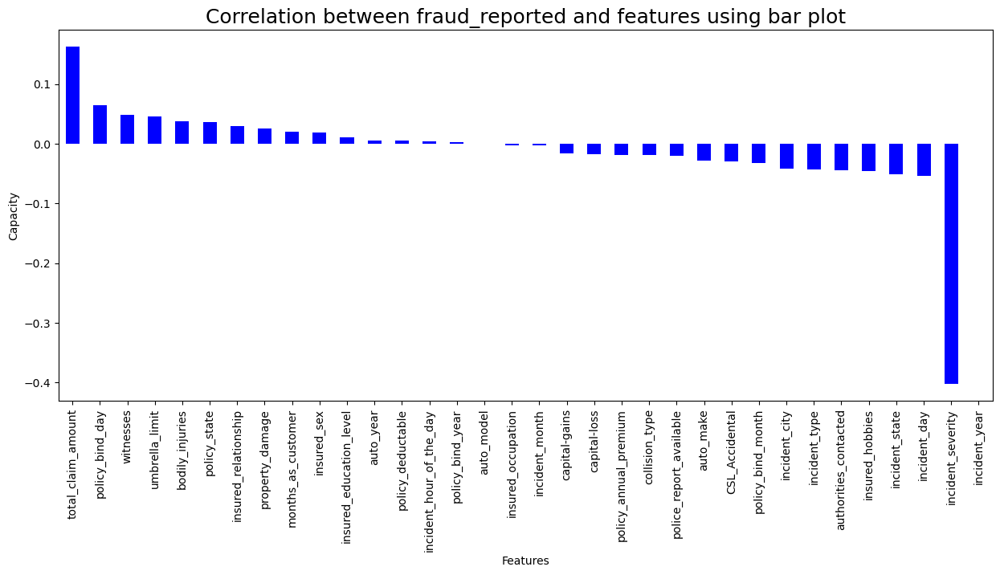

In [60]:
plt.figure(figsize=(15,6))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='blue')
plt.xlabel('Features',fontsize=10)
plt.ylabel('Capacity',fontsize=10)
plt.title('Correlation between fraud_reported and features using bar plot',fontsize=18)
plt.show()

In [61]:
# dropping irrelevant columns
df.drop(columns=['auto_year','policy_deductable', 'incident_hour_of_the_day',
                 'incident_month','insured_occupation', 'policy_bind_year',
                 'auto_model', 'incident_year',],axis=1,inplace=True)

In [62]:
df.shape

(984, 27)

Observations:
**Strong Positive Correlations with Fraud Reported:**
- The following features have strong positive correlations with "fraud_reported":
  - "incident_severity" (0.40)
  - "total_claim_amount" (0.16)
  - "policy_bind_day" (0.06)
  - "incident_day" (0.05)
  - "incident_state" (0.05)
  - "witnesses" (0.05)

**Moderate Positive Correlations with Fraud Reported:**
- Several features show moderate positive correlations with "fraud_reported," including "insured_hobbies," "umbrella_limit," "authorities_contacted," "incident_type," "incident_city," "bodily_injuries," and "policy_state."

**Weak Positive Correlations with Fraud Reported:**
- Features with weak positive correlations include "policy_bind_month," "CSL_Accidental," "insured_relationship," "auto_make," "property_damage," "police_report_available," "months_as_customer," "insured_sex," "collision_type," "policy_annual_premium," "capital-loss," "capital-gains," and "insured_education_level."

**Dropped Columns:**
- The following columns were dropped due to low correlation or other considerations:
  - 'auto_year', 'policy_deductable', 'incident_hour_of_the_day', 'incident_month', 'insured_occupation', 'policy_bind_year', 'auto_model', 'incident_year'

**Overall Observations:**
- The presence of strong positive correlations suggests that certain factors, such as incident severity, total claim amount, and specific days, may be indicative of potential fraud.
- Features dropped may not have a strong linear relationship with the target variable or may have been deemed less relevant for the analysis.
- Further analysis, including exploration of non-linear relationships and domain knowledge, may provide additional insights into the relationships between features and the likelihood of fraud reported.

In [63]:
# Splitting data in target and dependent feature
X = df.drop(['fraud_reported'], axis =1)
Y = df['fraud_reported']

# Checking the dimenstion of X & Y
X.shape, Y.shape

((984, 26), (984,))

In [64]:
# Features Scaling
scaler= StandardScaler()
X_scale = scaler.fit_transform(X)
scaled_df = pd.DataFrame(X_scale, columns=X.columns)
scaled_df

,months_as_customer,policy_state,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_hobbies,insured_relationship,capital-gains,capital-loss,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,policy_bind_day,policy_bind_month,incident_day,CSL_Accidental
0,1.073151,1.182960,0.614144,-0.336103,1.073859,0.532733,1.277884,-1.439726,1.002460,0.955582,...,1.517239,0.004971,0.461318,1.474515,0.719218,0.851634,0.172081,1.014270,1.144504,0.065771
1,0.205631,-0.022043,-0.241928,1.485696,1.073859,0.532733,0.925808,-0.250229,-0.906827,0.955582,...,-0.659092,-1.217926,-1.336453,-0.678189,-1.777508,0.355771,1.303948,-0.161972,0.760597,0.065771
2,-0.609839,1.182960,0.639578,1.485696,-0.931221,1.557581,-1.362682,0.344519,0.350508,0.955582,...,-0.659092,1.227868,1.360204,-0.678189,-0.716420,-0.635954,-0.733413,-0.161972,0.856574,-1.178814
3,0.448536,-1.227046,0.650193,1.792088,-0.931221,1.557581,-1.362682,0.939267,0.844845,-1.267071,...,-0.659092,0.004971,0.461318,-0.678189,0.394128,-0.883885,1.077574,-0.456033,-1.158939,0.065771
4,0.205631,-1.227046,1.336758,1.792088,1.073859,-1.516962,-1.362682,0.939267,1.457393,-0.682912,...,-0.659092,-1.217926,-0.437567,-0.678189,-1.730354,-1.627679,-1.072973,-0.161972,0.376689,1.310356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979,-1.746291,1.182960,0.221769,-0.336103,-0.931221,1.045157,0.573733,0.939267,-0.906827,0.955582,...,1.517239,-1.217926,-0.437567,-0.678189,1.343996,-0.140091,0.058894,0.132088,0.856574,1.310356
980,0.700117,-1.227046,0.736131,-0.336103,-0.931221,1.557581,1.277884,1.534016,1.632918,0.955582,...,1.517239,1.227868,1.360204,-0.678189,2.210137,1.595427,-1.638907,-0.456033,1.048527,-1.178814
981,-0.644540,1.182960,0.518531,0.842458,-0.931221,1.045157,-1.186644,-0.250229,0.350508,0.955582,...,-0.659092,1.227868,1.360204,1.474515,0.556107,1.099565,0.172081,-1.338214,0.952550,0.065771
982,2.200928,-1.227046,0.410057,1.485696,1.073859,-1.516962,-1.714758,1.534016,-0.906827,0.955582,...,-0.659092,-1.217926,-0.437567,1.474515,-0.246241,-1.379747,0.285267,1.308330,1.240481,1.310356


# <span style="color:red;"> Multicollinearity</span>

In [66]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(X_scale,i) for i in range(len(X.columns))]
vif["Features"] = X.columns
vif

,VIF values,Features
0,1.039769,months_as_customer
1,1.028200,policy_state
2,1.028414,policy_annual_premium
3,1.033152,umbrella_limit
4,1.014852,insured_sex
5,1.031165,insured_education_level
6,1.038521,insured_hobbies
7,1.037078,insured_relationship
8,1.024740,capital-gains
9,1.033748,capital-loss


The VIF for the independent features is below the acceptable threshold of 10.Hence, we can proceed further

# <span style="color:red;">Feature Selection</span>

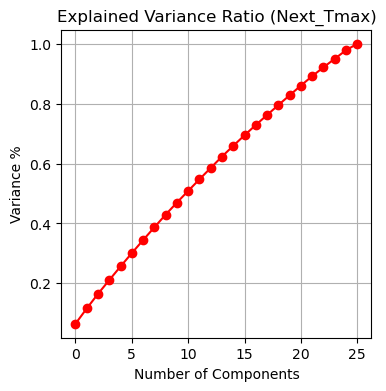

In [69]:
from sklearn.decomposition import PCA

pca = PCA()

# Perform PCA for the dataset (X_scale)
x_pca = pca.fit_transform(X_scale)

plt.figure(figsize=(4, 4))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained Variance Ratio (Next_Tmax)')
plt.grid()

Based on the graph, it can be seen that the first 23 principal components explain 90% of the variation in the data. Therefore, we will select these 23 components for our prediction.`

In [70]:
# selection of features
pca = PCA(n_components=23)
x_new = pca.fit_transform(X_scale)

principle_x = pd.DataFrame(x_new)
principle_x

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,0.651878,2.403876,-0.226018,2.262914,0.087529,0.091334,-0.142514,-0.459375,-1.302480,0.292546,...,0.083981,-0.539955,-0.423405,-0.658112,-0.689591,-1.728061,0.191697,-0.589675,-0.165726,0.115581
1,-2.374957,-0.044306,0.155046,0.040480,0.017720,-1.323508,0.729699,1.558761,-0.939907,1.762260,...,-1.136858,-0.350335,0.148497,-0.760427,0.141764,-0.057819,0.157448,-1.668188,-0.213231,-0.603799
2,-0.335403,-0.907093,-0.329470,-0.844414,0.604053,1.755536,-1.272555,-1.311747,-0.196056,-0.897907,...,-0.820091,-1.645584,0.505791,0.813388,-0.536418,-0.426229,-0.542580,0.671835,-1.992315,0.394463
3,0.260141,-2.456132,-1.289330,-1.205226,1.063825,0.063180,0.776361,0.033679,0.011307,-0.765776,...,0.599244,-1.660110,-0.692901,-1.226002,0.137495,-0.357952,-1.641548,-0.173498,-0.876412,-0.133825
4,-1.979908,-1.913270,0.403882,0.219580,0.255230,0.279883,0.430012,-0.353440,2.054392,-0.961573,...,-1.283593,0.332123,0.545115,-1.281149,1.190706,-2.417156,-0.443024,-0.719994,0.471941,-0.735279
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979,0.853354,-0.109178,1.769725,0.119444,-0.522529,-0.670275,-0.145480,-0.061002,-0.621861,-1.900799,...,-1.372852,-0.249832,-1.907417,-0.816236,-0.512860,0.898847,0.808896,-0.886417,-0.378533,-0.107439
980,2.306166,0.813152,-0.143407,-0.039569,0.499457,0.577039,1.880636,-2.496636,-0.906541,0.154028,...,0.722501,-1.176195,-1.710847,1.715546,-0.945817,-1.639620,1.344056,-0.423317,-0.866475,-1.258292
981,0.227632,0.908033,-1.214909,-0.129172,1.245827,3.133767,-1.849601,-0.619727,-0.093631,-0.367449,...,-1.005790,-1.834882,-0.196332,0.104840,-1.070416,0.183577,-0.344167,0.651623,-0.222229,0.580261
982,-0.235177,-2.955954,0.155067,2.143416,0.797834,0.594308,-1.007414,1.160315,0.930476,0.416080,...,-0.641949,-0.989685,-0.230537,-2.456204,0.763575,-2.702376,0.454352,-0.426845,1.214813,-0.226337


In [71]:
# Class balancing
Y.value_counts()

0    743
1    241
Name: fraud_reported, dtype: int64

In [72]:
sm=SMOTE()

X,Y=sm.fit_resample(principle_x,Y)
Y.value_counts()

1    743
0    743
Name: fraud_reported, dtype: int64

# <span style="color:red;">Machine Learning</span>

In [74]:
# Initialize all the classification models
LR_model = LogisticRegression()
Ridge_model = RidgeClassifier()
DT_model = DecisionTreeClassifier()
SV_model = SVC()
KNR_model = KNeighborsClassifier()
RFR_model = RandomForestClassifier()
XGB_model = XGBClassifier()
SDG_model = SGDClassifier()
BG_model = BaggingClassifier()
ADA_model = AdaBoostClassifier()
ET_model = ExtraTreesClassifier()

# Create a list of models for iteration
classification_models = [
    (LR_model, "Logistic Regression"),
    (DT_model, "Decision Tree Classifier"),
    (KNR_model, "K-Neighbors Classifier"),
    (RFR_model, "Random Forest Classifier"),
    (ET_model, "ExtraTrees Classifier"),
    (Ridge_model, "RidgeClassifier"),
    (XGB_model, "XGBClassifier"),
    (SDG_model, "SGDClassifier"),
    (BG_model, "BaggingClassifier"),
    (ADA_model, "AdaBoostClassifier"),
    (SV_model, "Support Vector Classifier"),
]

In [75]:
# Finding Best Models with Best Random State
# List to store model performance dictionaries
model_performances = []

# Iterate over the models and evaluate them using cross-validation
for model, model_name in classification_models:
    best_random_state = 0
    best_accuracy = 0
    best_cv_score = 0

    for random_state in range(1, 101):
        X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
        model.fit(X_train, Y_train)
        Y_pred = model.predict(X_test)
        accuracy = accuracy_score(Y_test, Y_pred)

        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_random_state = random_state

    # Now, calculate the model's performance metrics using the best random state
    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=best_random_state)
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)

    accuracy = accuracy_score(Y_test, Y_pred)
    conf_matrix = confusion_matrix(Y_test, Y_pred)
    classification_rep = classification_report(Y_test, Y_pred, output_dict=True)
    
    precision = classification_rep['weighted avg']['precision']
    recall = classification_rep['weighted avg']['recall']
    f1_score = classification_rep['weighted avg']['f1-score']
    support = classification_rep['weighted avg']['support']

    # Compute cross-validation score for the model after fitting
    cv_scores = cross_val_score(model, X, Y, cv=5)
    best_cv_score = cv_scores.mean()

    print(f"Model: {model_name}")
    print(f"Best Random State: {best_random_state}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-Score: {f1_score}")
    print(f"Support: {support}")
    print(f"Confusion Matrix:\n{conf_matrix}")
    print(f"Cross-Validation Score: {best_cv_score}")
    print("===" * 40)

    model_performance = {
        "Model": model_name,
        "Best Random State": best_random_state,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1-Score": f1_score,
        "Support": support,
        "Confusion Matrix": [conf_matrix.tolist()],
        "Cross-Validation Score": best_cv_score
    }
    
    model_performances.append(model_performance)

model_performance_df = pd.DataFrame(model_performances)

# Sort the models by accuracy in descending order
model_performance_df = model_performance_df.sort_values(by="Accuracy", ascending=False)
model_performance_df

Model: Logistic Regression
Best Random State: 16
Accuracy: 0.7623318385650224
Precision: 0.7621185729530661
Recall: 0.7623318385650224
F1-Score: 0.762086671165484
Support: 446.0
Confusion Matrix:
[[153  56]
 [ 50 187]]
Cross-Validation Score: 0.7355523919282309
Model: Decision Tree Classifier
Best Random State: 39
Accuracy: 0.7668161434977578
Precision: 0.7674221306508302
Recall: 0.7668161434977578
F1-Score: 0.7668724227873399
Support: 446.0
Confusion Matrix:
[[174  56]
 [ 48 168]]
Cross-Validation Score: 0.7523580322238039
Model: K-Neighbors Classifier
Best Random State: 26
Accuracy: 0.757847533632287
Precision: 0.8010373483019223
Recall: 0.757847533632287
F1-Score: 0.7445190942023203
Support: 446.0
Confusion Matrix:
[[111  98]
 [ 10 227]]
Cross-Validation Score: 0.7133279099722053
Model: Random Forest Classifier
Best Random State: 23
Accuracy: 0.8856502242152466
Precision: 0.8856671801550566
Recall: 0.8856502242152466
F1-Score: 0.8856542492592736
Support: 446.0
Confusion Matrix:
[[20

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,2,0.923767,0.926124,0.923767,0.923755,446.0,"[[[207, 9], [25, 205]]]",0.907159
3,Random Forest Classifier,23,0.885650,0.885667,0.885650,0.885654,446.0,"[[[201, 26], [25, 194]]]",0.848611
6,XGBClassifier,2,0.885650,0.885925,0.885650,0.885676,446.0,"[[[193, 23], [28, 202]]]",0.854008
10,Support Vector Classifier,81,0.865471,0.865639,0.865471,0.865398,446.0,"[[[184, 33], [27, 202]]]",0.841224
8,BaggingClassifier,71,0.813901,0.814473,0.813901,0.813987,446.0,"[[[175, 38], [45, 188]]]",0.831096
9,AdaBoostClassifier,29,0.786996,0.788555,0.786996,0.786883,446.0,"[[[172, 55], [40, 179]]]",0.757099
1,Decision Tree Classifier,39,0.766816,0.767422,0.766816,0.766872,446.0,"[[[174, 56], [48, 168]]]",0.752358
0,Logistic Regression,16,0.762332,0.762119,0.762332,0.762087,446.0,"[[[153, 56], [50, 187]]]",0.735552
5,RidgeClassifier,16,0.762332,0.762132,0.762332,0.761985,446.0,"[[[152, 57], [49, 188]]]",0.740262
2,K-Neighbors Classifier,26,0.757848,0.801037,0.757848,0.744519,446.0,"[[[111, 98], [10, 227]]]",0.713328


In [76]:
# Top 2 models
model_performance_df.head(2)

,Model,Best Random State,Accuracy,Precision,Recall,F1-Score,Support,Confusion Matrix,Cross-Validation Score
4,ExtraTrees Classifier,2,0.923767,0.926124,0.923767,0.923755,446.0,"[[[207, 9], [25, 205]]]",0.907159
3,Random Forest Classifier,23,0.885650,0.885667,0.885650,0.885654,446.0,"[[[201, 26], [25, 194]]]",0.848611


In [77]:
# HyperParameter Tunning For ExtraTrees Classifier
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=6)

param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 3, 4],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['auto', 'sqrt', 'log2'],
}

random_search = RandomizedSearchCV(estimator=ET_model,
                                   param_distributions=param_dist,
                                   n_iter=10, cv=5, n_jobs=-1, verbose=2)

random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Create a classifier with the best parameters
best_et = ExtraTreesClassifier(**best_params)

best_et.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_et = best_et.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_et)
print("Best Accuracy:", accuracy)

# Print classification report
class_report = classification_report(Y_test, Y_pred_et)
print("Classification Report:")
print(class_report)

# Perform cross-validation and print scores
cross_val_scores = cross_val_score(best_et, X_train, Y_train, cv=5)
print("Cross-Validation Scores:", cross_val_scores)
print("Mean CV Score:", np.mean(cross_val_scores))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Hyperparameters: {'n_estimators': 100, 'min_samples_split': 3, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 5}
Best Accuracy: 0.8026905829596412
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.77      0.80       226
           1       0.78      0.84      0.81       220

    accuracy                           0.80       446
   macro avg       0.80      0.80      0.80       446
weighted avg       0.80      0.80      0.80       446

Cross-Validation Scores: [0.74038462 0.75961538 0.70192308 0.78365385 0.78846154]
Mean CV Score: 0.7548076923076923


In [79]:
# HyperParameter Tunning For XGBClassifier
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=81)

param_dist = {
    'n_estimators': [100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

random_search = RandomizedSearchCV(estimator=XGB_model,
                                   param_distributions=param_dist,
                                   n_iter=10, cv=5, n_jobs=-1, verbose=2)

random_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Create a classifier with the best parameters
best_xgb = XGBClassifier(**best_params)

# Fit the best classifier on the training data
best_xgb.fit(X_train, Y_train)

# Make predictions on the test data
Y_pred_xgb = best_xgb.predict(X_test)

# Evaluate the best model
accuracy = accuracy_score(Y_test, Y_pred_xgb)
print("Best Accuracy:", accuracy)

# Print classification report
class_report = classification_report(Y_test, Y_pred_xgb)
print("Classification Report:")
print(class_report)

# Perform cross-validation and print scores
cross_val_scores = cross_val_score(best_xgb, X_train, Y_train, cv=5)
print("Cross-Validation Scores:", cross_val_scores)
print("Mean CV Score:", np.mean(cross_val_scores))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Hyperparameters: {'subsample': 1.0, 'n_estimators': 200, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.8}
Best Accuracy: 0.8430493273542601
Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.82      0.83       217
           1       0.83      0.87      0.85       229

    accuracy                           0.84       446
   macro avg       0.84      0.84      0.84       446
weighted avg       0.84      0.84      0.84       446

Cross-Validation Scores: [0.78365385 0.84615385 0.80288462 0.8125     0.83173077]
Mean CV Score: 0.8153846153846154


ROC AUC Score Of XGB Classifier: 0.9146962348821766


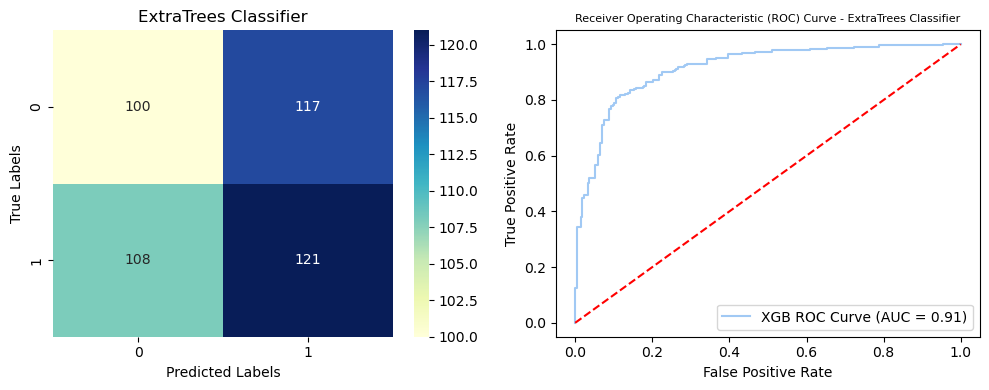

In [80]:
# Confusion Matrix & Roc Aoc Curve for ExtraTrees Classifier
cm_et = confusion_matrix(Y_test, Y_pred_et)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Plot ExtraTrees Classifier Confusion Matrix
sns.heatmap(cm_et, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0])
axes[0].set_title('ExtraTrees Classifier')
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')


# Calculate ROC AUC Score for ExtraTrees Classifier
y_prob_et = best_et.predict_proba(X_test)[:, 1]
auc_score_et = roc_auc_score(Y_test, y_prob_et)
print("ROC AUC Score Of XGB Classifier:", auc_score_et)

# Calculate ROC curves for ExtraTrees Classifier
fpr_et, tpr_et, _ = roc_curve(Y_test, y_prob_et)

# Plot ROC curve for ExtraTrees Classifier
axes[1].plot(fpr_et, tpr_et, label='XGB ROC Curve (AUC = {:.2f})'.format(auc_score_et))
axes[1].plot([0, 1], [0, 1], 'r--')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('Receiver Operating Characteristic (ROC) Curve - ExtraTrees Classifier', fontsize=8)
axes[1].legend(loc='lower right')

plt.tight_layout()
plt.show()

ROC AUC Score Of XGB Classifier: 0.9292455677862074


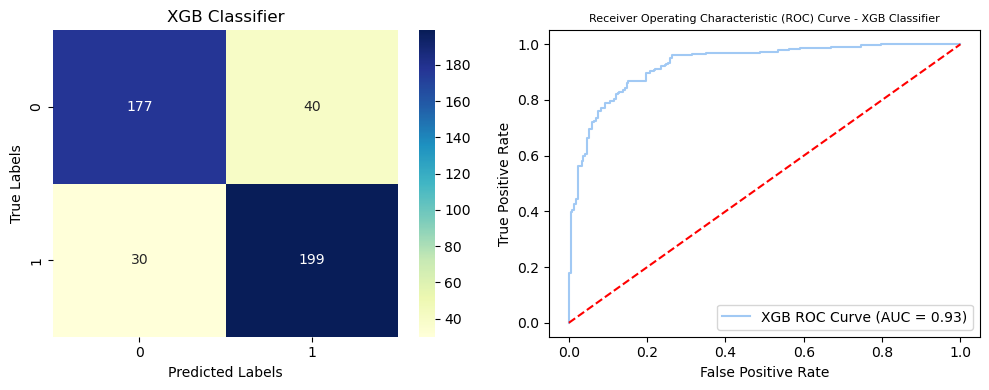

In [81]:
# For XGBClassifier
cm_xgb = confusion_matrix(Y_test, Y_pred_xgb)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="YlGnBu", ax=axes[0])
axes[0].set_title('XGB Classifier')
axes[0].set_xlabel('Predicted Labels')
axes[0].set_ylabel('True Labels')


# Calculate ROC AUC Score for xgb Classifier
y_prob_xgb = best_xgb.predict_proba(X_test)[:, 1]
auc_score_xgb = roc_auc_score(Y_test, y_prob_xgb)
print("ROC AUC Score Of XGB Classifier:", auc_score_xgb)

# Calculate ROC curves for xgb classifiers
fpr_xgb, tpr_xgb, _ = roc_curve(Y_test, y_prob_xgb)

# Plot ROC curve for XGB Classifier
axes[1].plot(fpr_xgb, tpr_xgb, label='XGB ROC Curve (AUC = {:.2f})'.format(auc_score_xgb))
axes[1].plot([0, 1], [0, 1], 'r--')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('Receiver Operating Characteristic (ROC) Curve - XGB Classifier', fontsize=8)
axes[1].legend(loc='lower right')

# Adjust layout and show plots
plt.tight_layout()
plt.show()

**Conclusion:**

**Consistency:**
- **XGBClassifier** maintains its position as the top-performing model after hyperparameter tuning.

**Generalization:**
- The model exhibits consistent performance across cross-validation scores, indicating good generalization.

**Improvement:**
- Although there is a slight decrease in accuracy after hyperparameter tuning, the overall model metrics have improved.
- Enhanced precision, recall, and F1-score values suggest improved performance in capturing both positive and negative instances.


# <span style="color:red;">Final Model - XGB </span>

In [82]:
filename= 'fraud_detection.pkl'
pickle.dump(best_xgb, open(filename, 'wb'))